In [ ]:
!pip install shap

In [ ]:
# Importing shap library
import shap
shap.initjs()

In [ ]:
!pip install anchor-exp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 427.3/427.3 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 22.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for anchor-exp: filename=anchor_exp-0.0.2.0-py3-none-any.whl size=433502 sha256=494b5fb49c2b52d78d3c84b56090724e9d2262dd4e7a519f1096f45b8d4cefea
  Stored in directory: /root/.cache/pip/wheels/02/f9/94/c51254cde228ec1397f5c2dafb60bacab62c53159f000857fe
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=7e3e79e94f879fae10c40c1d8e328c4039cf43448f5fb3bc9f1cd8967051c13a
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built anchor-exp lime


In [ ]:
!pip install dice-ml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 16.6 MB/s eta 0:00:00


In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 7.2 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import datetime
import numpy as np
import matplotlib.pyplot as plt
from catboost import CatBoostClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import average_precision_score, precision_recall_curve
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, precision_recall_curve, auc, confusion_matrix
)
from sklearn.metrics import auc
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
import seaborn as sns
from anchor import anchor_tabular
import dice_ml
from dice_ml.utils import helpers

In [ ]:
#To display all the columns and rows
pd.set_option('display.max_columns', 1000);
pd.set_option('display.max_rows', 1000);
pd.set_option('display.width', 1000);
#To ignore warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
#To supress scientific notations
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [ ]:
#Loading the necessary files
common_lasso_dataset = pd.read_csv("/content/drive/MyDrive/ColabNotebooks/Rare_Diseases_Research/Data/common_lasso_dataset.csv")
combo_lasso_dataset = pd.read_csv("/content/drive/MyDrive/ColabNotebooks/Rare_Diseases_Research/Data/combo_lasso_dataset.csv")
rare_lasso_dataset = pd.read_csv("/content/drive/MyDrive/ColabNotebooks/Rare_Diseases_Research/Data/rare_lasso_dataset.csv")
common_skin_lasso_dataset = pd.read_csv("/content/drive/MyDrive/ColabNotebooks/Rare_Diseases_Research/Data/common_skin_lasso_dataset.csv")

In [ ]:
common_lasso_dataset.shape

(3530, 107)

In [ ]:
common_skin_lasso_dataset.shape

(3628, 101)

In [ ]:
rare_lasso_dataset.shape

(3531, 108)

In [ ]:
#Categorical map for ANCHORs
cat_map={0:['Zero','Male','Female'],
         3:['Zero','OBSERVATION ADMIT', 'EW EMER.', 'EU OBSERVATION', 'URGENT', 'DIRECT OBSERVATION', 'SURGICAL SAME DAY ADMISSION', 'DIRECT EMER.',
            'ELECTIVE', 'AMBULATORY OBSERVATION'],
         4:['Zero','EMERGENCY ROOM', 'PHYSICIAN REFERRAL', 'TRANSFER FROM HOSPITAL', 'WALK-IN/SELF REFERRAL', 'CLINIC REFERRAL',
            'INTERNAL TRANSFER TO OR FROM PSYCH', 'TRANSFER FROM SKILLED NURSING FACILITY', 'AMBULATORY SURGERY TRANSFER',
            'PROCEDURE SITE', 'PACU', 'INFORMATION NOT AVAILABLE'],
         5:['Zero','HOME', 'HOME HEALTH CARE', 'SKILLED NURSING FACILITY', 'DIED', 'REHAB', 'HOSPICE', 'CHRONIC/LONG TERM ACUTE CARE',
            'AGAINST ADVICE', 'ACUTE HOSPITAL', 'PSYCH FACILITY', 'OTHER FACILITY', 'ASSISTED LIVING', 'HEALTHCARE FACILITY', 'INFORMATION NOT AVAILABLE'],
         6:['Zero','Medicare','Medicaid','Other'],
         7:['Zero','English','Other'],
         8:['Zero','MARRIED', 'SINGLE', 'DIVORCED', 'WIDOWED', 'INFORMATION NOT AVAILABLE'],
         9:['Zero','WHITE', 'BLACK', 'ASIAN', 'LATINOS', 'OTHERS', 'UNKNOWN'],
         14:['Zero','WINTER', 'SPRING', 'SUMMER', 'FALL']
         }

## 1. Prediction Interpretability with High Confidence Correct Classification

This part is to generate the prediction probabilities graphs and explain the true positive, true negative (high confidence correct classification) cases as diagnostic narratives using SHAP and ANCHORs.

### 1.1 Common Disorders vs Rare Skin Disorders

In [ ]:
# Separate features and target
X = common_lasso_dataset.drop(columns=["target"])
y = common_lasso_dataset["target"]

# Train-test split
X = X.replace(-99999, np.nan)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Save to new dataframes
X_train_common_df = X_train.copy()
y_train_common_df = y_train.copy()
X_test_common_df = X_test.copy()
y_test_common_df = y_test.copy()

# Train CatBoost
model1 = CatBoostClassifier(verbose=0, random_state=42)
model1.fit(X_train, y_train)

# Get predictions and probabilities
y_pred = model1.predict(X_test)
y_proba_1 = model1.predict_proba(X_test)[:, 1]  # Probabilities for class 1
y_proba_0 = model1.predict_proba(X_test)[:, 0]  # Probabilities for class 0

# Define feature names
feature_names_common = X_train_common_df.columns.tolist()

# Combine test set info into a single DataFrame
results_common_df = X_test.copy()
results_common_df["y_true"] = y_test.values
results_common_df["y_pred"] = y_pred
results_common_df["y_proba_1"] = y_proba_1
results_common_df["y_proba_0"] = y_proba_0

# Define outcome category (TP, FP, TN, FN)
results_common_df["pred_type"] = np.where((results_common_df["y_true"] == 1) & (results_common_df["y_pred"] == 1), "TP",
    np.where((results_common_df["y_true"] == 0) & (results_common_df["y_pred"] == 1), "FP",
    np.where((results_common_df["y_true"] == 0) & (results_common_df["y_pred"] == 0), "TN", "FN")))

# Filter probabilities between 0.5 to 1.0
filtered_1 = results_common_df[results_common_df["y_proba_1"] >= 0.5]
filtered_0 = results_common_df[results_common_df["y_proba_0"] >= 0.5]

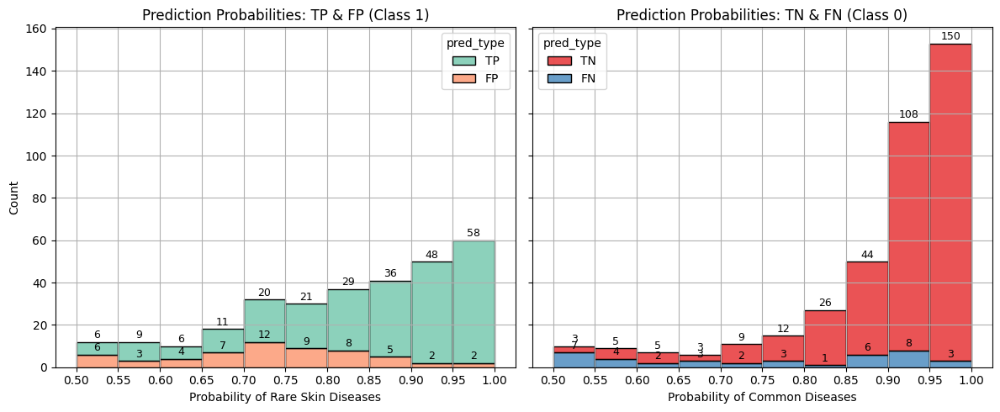

In [ ]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# ---------- Histogram 1: TP + FP using y_proba_1 ----------
sns.histplot(
    data=filtered_1[filtered_1["pred_type"].isin(["TP", "FP"])],
    x="y_proba_1",
    hue="pred_type",
    bins=np.arange(0.5, 1.05, 0.05),
    multiple="stack",
    palette="Set2",
    ax=axs[0]
)

axs[0].set_title("Prediction Probabilities: TP & FP (Class 1)")
axs[0].set_xlabel("Probability of Rare Skin Diseases")
axs[0].set_ylabel("Count")
axs[0].set_xticks(np.arange(0.5, 1.05, 0.05))
axs[0].grid(True)

# Annotate bars for TP/FP
for container in axs[0].containers:
    for bar in container:
        height = bar.get_height()
        if height > 0:
            x = bar.get_x() + bar.get_width() / 2
            y = bar.get_y() + height
            axs[0].text(x, y + 0.5, int(height), ha='center', fontsize=9, va='bottom')


# ---------- Histogram 2: TN + FN using y_proba_0 ----------
sns.histplot(
    data=filtered_0[filtered_0["pred_type"].isin(["TN", "FN"])],
    x="y_proba_0",
    hue="pred_type",
    bins=np.arange(0.5, 1.05, 0.05),
    multiple="stack",
    palette="Set1",
    ax=axs[1]
)

axs[1].set_title("Prediction Probabilities: TN & FN (Class 0)")
axs[1].set_xlabel("Probability of Common Diseases")
axs[1].set_ylabel("Count")
axs[1].set_xticks(np.arange(0.5, 1.05, 0.05))
axs[1].grid(True)

# Annotate bars for TN/FN
for container in axs[1].containers:
    for bar in container:
        height = bar.get_height()
        if height > 0:
            x = bar.get_x() + bar.get_width() / 2
            y = bar.get_y() + height
            axs[1].text(x, y + 0.5, int(height), ha='center', fontsize=9, va='bottom')

# Final layout
plt.tight_layout()
plt.show()

In [ ]:
# Updated filtering function that chooses between proba_1 and proba_0
def filter_by_pred_type_and_proba(df, pred_type, lower=None, upper=None, greater_than=None):
    # Select relevant probability column
    if pred_type in ["TP", "FP"]:
        prob_col = "y_proba_1"
    elif pred_type in ["TN", "FN"]:
        prob_col = "y_proba_0"
    else:
        raise ValueError("Invalid prediction type")

    # Filter by prediction type
    filtered = df[df["pred_type"] == pred_type]

    # Apply probability filter
    if lower is not None and upper is not None:
        return filtered[(filtered[prob_col] >= lower) & (filtered[prob_col] < upper)]
    elif greater_than is not None:
        return filtered[filtered[prob_col] > greater_than]
    else:
        return filtered

# Create dataframes with the updated helper
tp_boundary_common = filter_by_pred_type_and_proba(results_common_df, "TP", 0.50, 0.55)
fp_boundary_common = filter_by_pred_type_and_proba(results_common_df, "FP", 0.50, 0.55)
tn_boundary_common = filter_by_pred_type_and_proba(results_common_df, "TN", 0.50, 0.55)
fn_boundary_common = filter_by_pred_type_and_proba(results_common_df, "FN", 0.50, 0.55)

fp_high_conf_common = filter_by_pred_type_and_proba(results_common_df, "FP", greater_than=0.90)
fn_high_conf_common = filter_by_pred_type_and_proba(results_common_df, "FN", greater_than=0.90)
tp_high_conf_common = filter_by_pred_type_and_proba(results_common_df, "TP", greater_than=0.90)
tn_high_conf_common = filter_by_pred_type_and_proba(results_common_df, "TN", greater_than=0.90)

In [ ]:
# Using SHAP to explain the model's predictions
%%time
explainer_shap_common = shap.TreeExplainer(model1)
shap_values_common = explainer_shap_common.shap_values(X_test_common_df)

CPU times: user 3.74 s, sys: 88.2 ms, total: 3.83 s
Wall time: 3.46 s


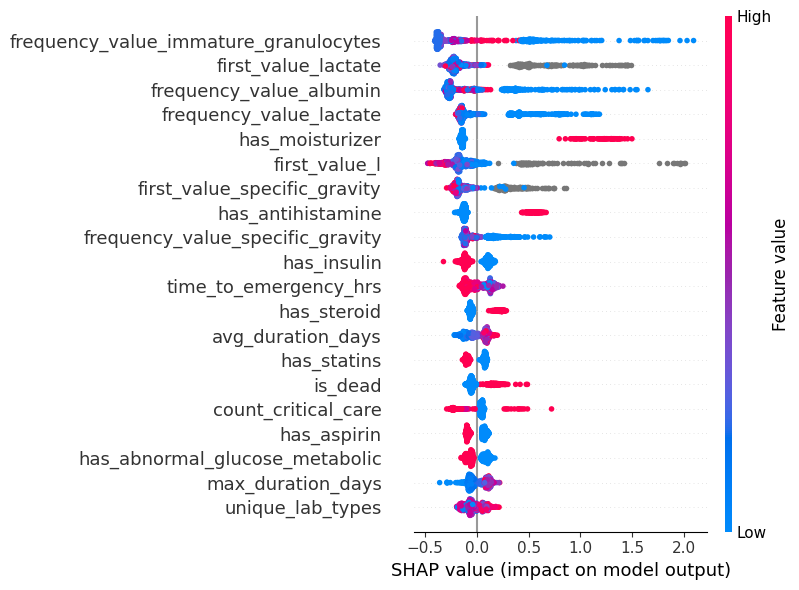

In [ ]:
#SHAP Summary plot
shap.summary_plot(shap_values_common, X_test_common_df, plot_size=(8, 6))

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_df.index.get_loc(1615)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_df.loc[1615]
shap_values_for_instance = shap_values_common[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common.expected_value, shap_values_for_instance, instance)

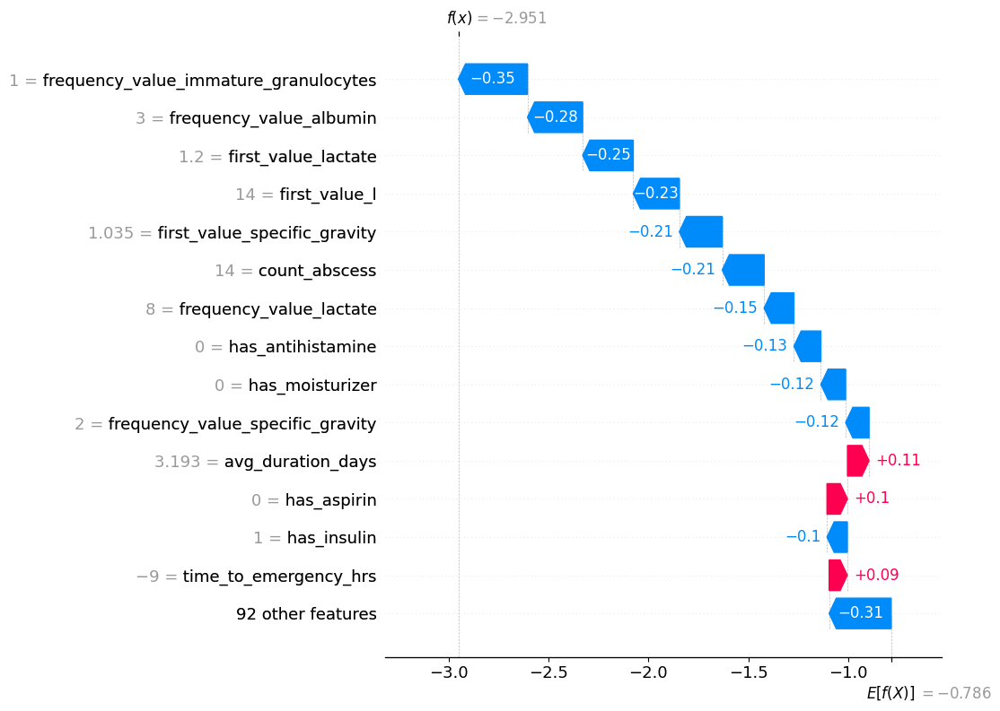

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_common.expected_value,
                                     data=instance, feature_names=X_test_common_df.columns.tolist()), max_display=15)

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_df.index.get_loc(508)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_df.loc[508]
shap_values_for_instance = shap_values_common[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common.expected_value, shap_values_for_instance, instance)

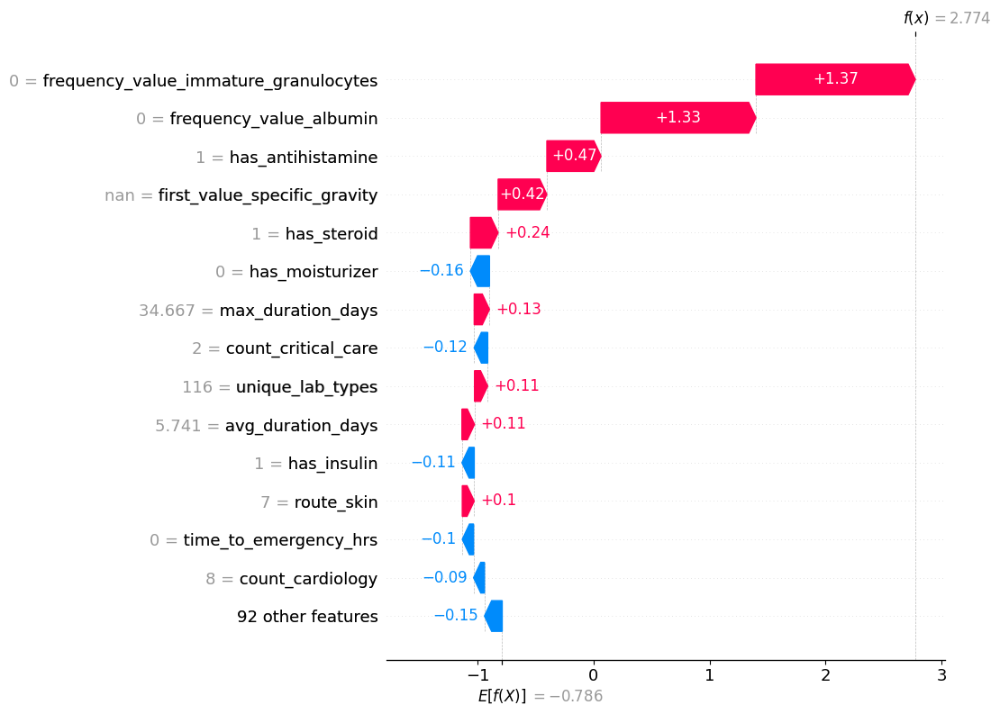

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_common.expected_value,
                                     data=instance, feature_names=X_test_common_df.columns.tolist()), max_display=15)

ANCHOR Explanations

In [ ]:
#Creating an anchor explainer object by providing feature names, categorical mapping, output values and training data
anchor_explainer_common = anchor_tabular.AnchorTabularExplainer(['Common Disease','Rare Skin Disease'],
                                                                feature_names_common,X_train_common_df.values,categorical_names=cat_map)

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_common.explain_instance(X_test_common_df.loc[508].to_numpy(), model1.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_common.class_names[model1.predict(X_test_common_df.loc[508].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_immature_granulocytes <= 0.00 AND has_steroid > 0.00 AND has_antihistamine > 0.00 THEN Rare Skin Disease
Precision: 0.97
Coverage: 0.02


In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_common.explain_instance(X_test_common_df.loc[1615].to_numpy(), model1.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_common.class_names[model1.predict(X_test_common_df.loc[1615].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_immature_granulocytes > 0.00 AND count_respiratory > 7.00 AND count_radiology <= 12.00 THEN Common Disease
Precision: 0.96
Coverage: 0.10


### 1.2 Rare Disorders vs Rare Skin Disorders

In [ ]:
# Separate features and target
X = rare_lasso_dataset.drop(columns=["target"])
y = rare_lasso_dataset["target"]

# Train-test split
X = X.replace(-99999, np.nan)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Save to new dataframes
X_train_rare_df = X_train.copy()
y_train_rare_df = y_train.copy()
X_test_rare_df = X_test.copy()
y_test_rare_df = y_test.copy()

# Train CatBoost
model2 = CatBoostClassifier(verbose=0, random_state=42)
model2.fit(X_train, y_train)

# Get predictions and probabilities
y_pred = model2.predict(X_test)
y_proba_1 = model2.predict_proba(X_test)[:, 1]  # Probabilities for class 1
y_proba_0 = model2.predict_proba(X_test)[:, 0]  # Probabilities for class 0

# Define feature names
feature_names_rare = X_train_rare_df.columns.tolist()

# Combine test set info into a single DataFrame
results_rare_df = X_test.copy()
results_rare_df["y_true"] = y_test.values
results_rare_df["y_pred"] = y_pred
results_rare_df["y_proba_1"] = y_proba_1
results_rare_df["y_proba_0"] = y_proba_0

# Define outcome category (TP, FP, TN, FN)
results_rare_df["pred_type"] = np.where(
    (results_rare_df["y_true"] == 1) & (results_rare_df["y_pred"] == 1), "TP",
    np.where((results_rare_df["y_true"] == 0) & (results_rare_df["y_pred"] == 1), "FP",
    np.where((results_rare_df["y_true"] == 0) & (results_rare_df["y_pred"] == 0), "TN", "FN"))
)

# Filter probabilities between 0.5 to 1.0
filtered_1 = results_rare_df[results_rare_df["y_proba_1"] >= 0.5]
filtered_0 = results_rare_df[results_rare_df["y_proba_0"] >= 0.5]


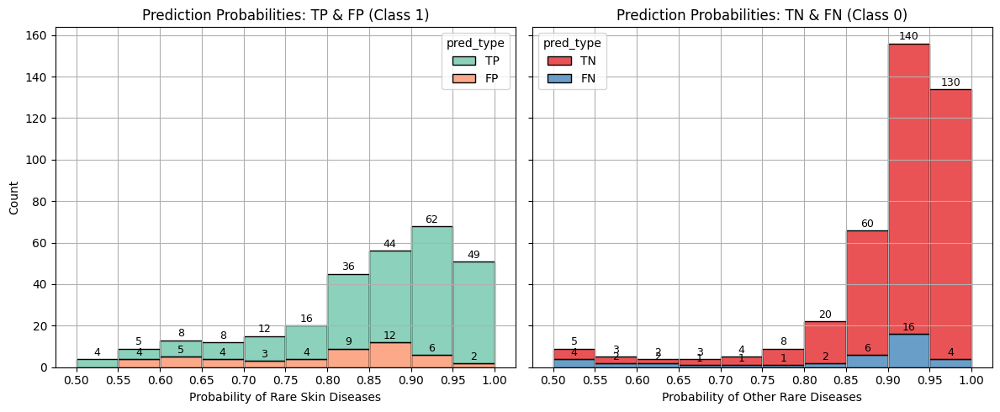

In [ ]:
# Create subplots
fig, axs1 = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# ---------- Histogram 1: TP + FP using y_proba_1 ----------
sns.histplot(
    data=filtered_1[filtered_1["pred_type"].isin(["TP", "FP"])],
    x="y_proba_1",
    hue="pred_type",
    bins=np.arange(0.5, 1.05, 0.05),
    multiple="stack",
    palette="Set2",
    ax=axs1[0]
)

axs1[0].set_title("Prediction Probabilities: TP & FP (Class 1)")
axs1[0].set_xlabel("Probability of Rare Skin Diseases")
axs1[0].set_ylabel("Count")
axs1[0].set_xticks(np.arange(0.5, 1.05, 0.05))
axs1[0].grid(True)

# Annotate bars for TP/FP
for container in axs1[0].containers:
    for bar in container:
        height = bar.get_height()
        if height > 0:
            x = bar.get_x() + bar.get_width() / 2
            y = bar.get_y() + height
            axs1[0].text(x, y + 0.5, int(height), ha='center', fontsize=9, va='bottom')


# ---------- Histogram 2: TN + FN using y_proba_0 ----------
sns.histplot(
    data=filtered_0[filtered_0["pred_type"].isin(["TN", "FN"])],
    x="y_proba_0",
    hue="pred_type",
    hue_order=["TN", "FN"],
    bins=np.arange(0.5, 1.05, 0.05),
    multiple="stack",
    palette="Set1",
    ax=axs1[1]
)

axs1[1].set_title("Prediction Probabilities: TN & FN (Class 0)")
axs1[1].set_xlabel("Probability of Other Rare Diseases")
axs1[1].set_ylabel("Count")
axs1[1].set_xticks(np.arange(0.5, 1.05, 0.05))
axs1[1].grid(True)

# Annotate bars for TN/FN
for container in axs1[1].containers:
    for bar in container:
        height = bar.get_height()
        if height > 0:
            x = bar.get_x() + bar.get_width() / 2
            y = bar.get_y() + height
            axs1[1].text(x, y + 0.5, int(height), ha='center', fontsize=9, va='bottom')

# Final layout
plt.tight_layout()
plt.show()

In [ ]:
# Updated filtering function that chooses between proba_1 and proba_0
def filter_by_pred_type_and_proba(df, pred_type, lower=None, upper=None, greater_than=None):
    # Select relevant probability column
    if pred_type in ["TP", "FP"]:
        prob_col = "y_proba_1"
    elif pred_type in ["TN", "FN"]:
        prob_col = "y_proba_0"
    else:
        raise ValueError("Invalid prediction type")

    # Filter by prediction type
    filtered = df[df["pred_type"] == pred_type]

    # Apply probability filter
    if lower is not None and upper is not None:
        return filtered[(filtered[prob_col] >= lower) & (filtered[prob_col] < upper)]
    elif greater_than is not None:
        return filtered[filtered[prob_col] > greater_than]
    else:
        return filtered

# Create dataframes with the updated helper for rare dataset
tp_boundary_rare = filter_by_pred_type_and_proba(results_rare_df, "TP", 0.50, 0.55)
fp_boundary_rare = filter_by_pred_type_and_proba(results_rare_df, "FP", 0.50, 0.55)
tn_boundary_rare = filter_by_pred_type_and_proba(results_rare_df, "TN", 0.50, 0.55)
fn_boundary_rare = filter_by_pred_type_and_proba(results_rare_df, "FN", 0.50, 0.55)

fp_high_conf_rare = filter_by_pred_type_and_proba(results_rare_df, "FP", greater_than=0.90)
fn_high_conf_rare = filter_by_pred_type_and_proba(results_rare_df, "FN", greater_than=0.90)
tp_high_conf_rare = filter_by_pred_type_and_proba(results_rare_df, "TP", greater_than=0.90)
tn_high_conf_rare = filter_by_pred_type_and_proba(results_rare_df, "TN", greater_than=0.90)

In [ ]:
# Using SHAP to explain the model's predictions
%%time
explainer_shap_rare = shap.TreeExplainer(model2)
shap_values_rare = explainer_shap_rare.shap_values(X_test_rare_df)

CPU times: user 3.53 s, sys: 41.7 ms, total: 3.58 s
Wall time: 1.98 s


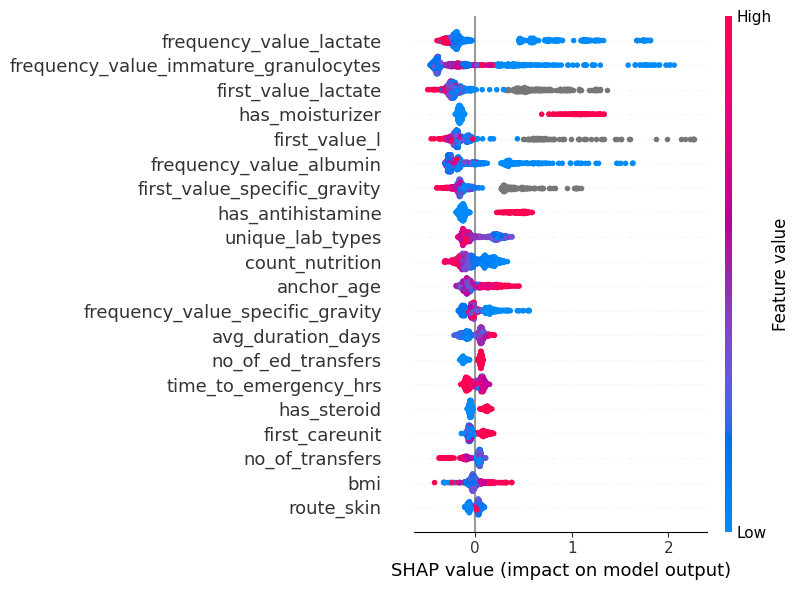

In [ ]:
#SHAP Summary plot
shap.summary_plot(shap_values_rare, X_test_rare_df, plot_size=(8, 6))

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_rare_df.index.get_loc(84)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[84]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

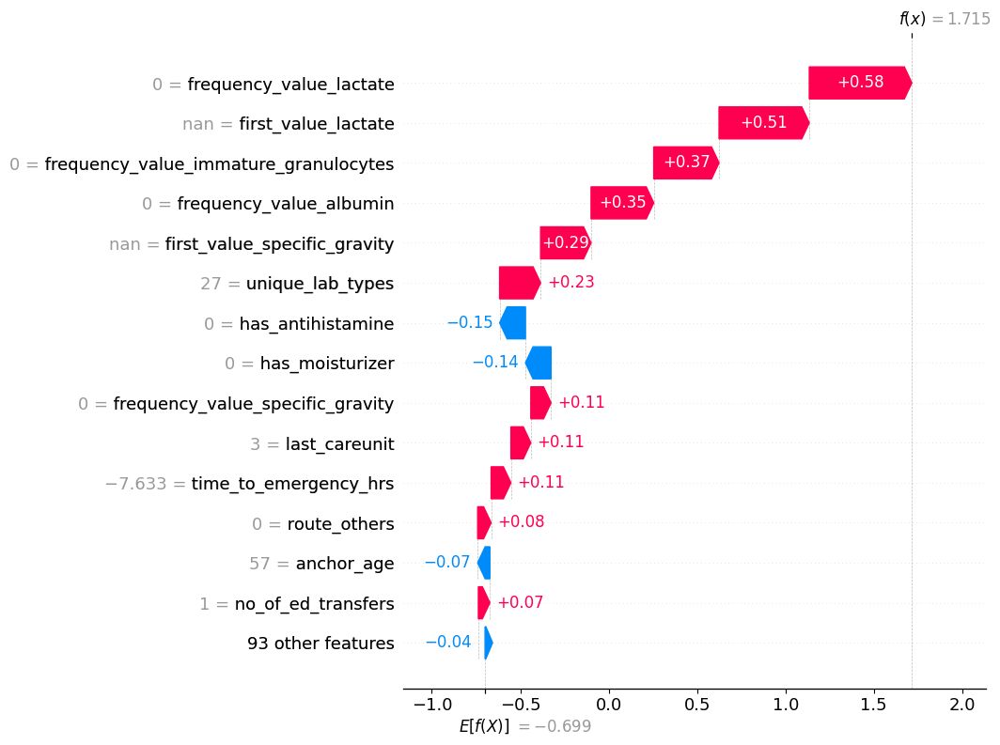

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_rare.expected_value,
                                     data=instance, feature_names=X_test_rare_df.columns.tolist()), max_display=15)

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_rare_df.index.get_loc(1615)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[1615]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

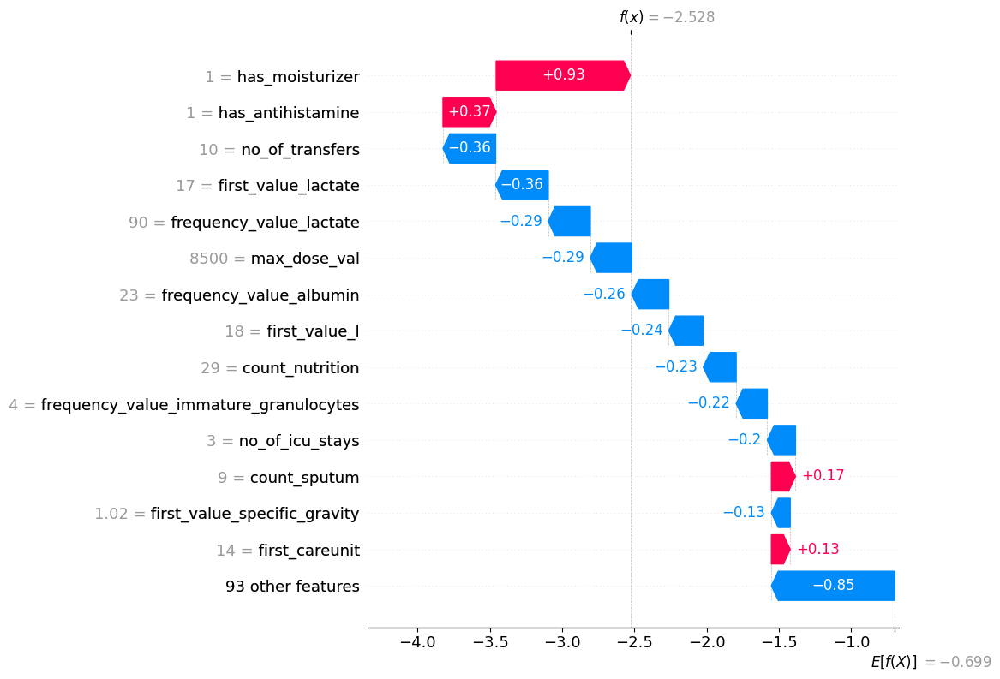

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_rare.expected_value,
                                     data=instance, feature_names=X_test_rare_df.columns.tolist()), max_display=15)

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_rare_df.index.get_loc(424)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[424]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

In [ ]:
#Creating an anchor explainer object by providing feature names, categorical mapping, output values and training data
anchor_explainer_rare = anchor_tabular.AnchorTabularExplainer(['Rare Disease','Rare Skin Disease'],
                                                                feature_names_rare,X_train_rare_df.values,categorical_names=cat_map)

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_df.loc[84].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_df.loc[84].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND unique_lab_types <= 59.00 AND time_to_emergency_hrs <= -3.52 AND race = WHITE THEN Rare Skin Disease
Precision: 0.97
Coverage: 0.08


In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_df.loc[1615].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_df.loc[1615].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate > 6.00 AND count_critical_care > 0.00 AND count_cardiology > 2.00 AND has_steroid <= 0.00 THEN Rare Disease
Precision: 0.97
Coverage: 0.06


### 1.3 Common Skin Disorders vs Rare Skin Disorders

In [ ]:
# Separate features and target
X = common_skin_lasso_dataset.drop(columns=["target"])
y = common_skin_lasso_dataset["target"]

# Train-test split
X = X.replace(-99999, np.nan)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Save to new dataframes
X_train_common_skin_df = X_train.copy()
y_train_common_skin_df = y_train.copy()
X_test_common_skin_df = X_test.copy()
y_test_common_skin_df = y_test.copy()

# Train CatBoost
model3 = CatBoostClassifier(verbose=0, random_state=42)
model3.fit(X_train, y_train)

# Get predictions and probabilities
y_pred = model3.predict(X_test)
y_proba_1 = model3.predict_proba(X_test)[:, 1]  # Probabilities for class 1
y_proba_0 = model3.predict_proba(X_test)[:, 0]  # Probabilities for class 0

# Define feature names
feature_names_common_skin = X_train_common_skin_df.columns.tolist()

# Combine test set info into a single DataFrame
results_common_skin_df = X_test.copy()
results_common_skin_df["y_true"] = y_test.values
results_common_skin_df["y_pred"] = y_pred
results_common_skin_df["y_proba_1"] = y_proba_1
results_common_skin_df["y_proba_0"] = y_proba_0

# Define outcome category (TP, FP, TN, FN)
results_common_skin_df["pred_type"] = np.where(
    (results_common_skin_df["y_true"] == 1) & (results_common_skin_df["y_pred"] == 1), "TP",
    np.where((results_common_skin_df["y_true"] == 0) & (results_common_skin_df["y_pred"] == 1), "FP",
    np.where((results_common_skin_df["y_true"] == 0) & (results_common_skin_df["y_pred"] == 0), "TN", "FN"))
)

# Filter probabilities between 0.5 to 1.0
filtered_1 = results_common_skin_df[results_common_skin_df["y_proba_1"] >= 0.5]
filtered_0 = results_common_skin_df[results_common_skin_df["y_proba_0"] >= 0.5]

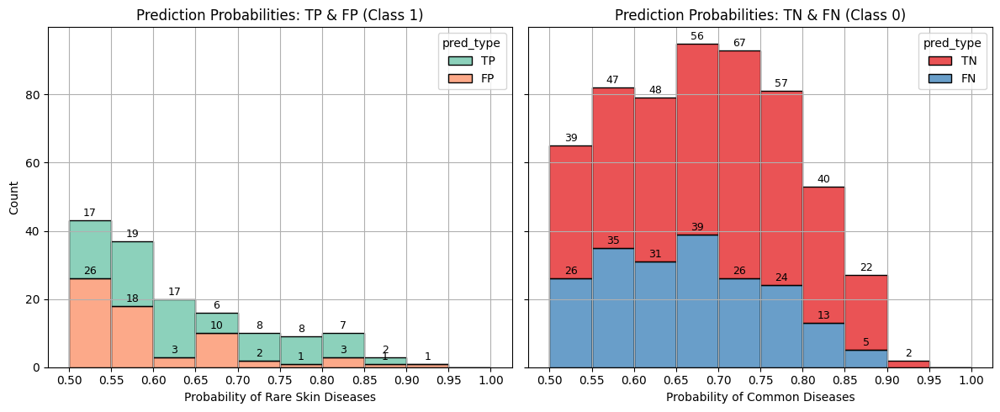

In [ ]:
# Create subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# ---------- Histogram 1: TP + FP using y_proba_1 ----------
sns.histplot(
    data=filtered_1[filtered_1["pred_type"].isin(["TP", "FP"])],
    x="y_proba_1",
    hue="pred_type",
    hue_order=["TP", "FP"],
    bins=np.arange(0.5, 1.05, 0.05),
    multiple="stack",
    palette="Set2",
    ax=axs[0]
)

axs[0].set_title("Prediction Probabilities: TP & FP (Class 1)")
axs[0].set_xlabel("Probability of Rare Skin Diseases")
axs[0].set_ylabel("Count")
axs[0].set_xticks(np.arange(0.5, 1.05, 0.05))
axs[0].grid(True)

# Annotate bars for TP/FP
for container in axs[0].containers:
    for bar in container:
        height = bar.get_height()
        if height > 0:
            x = bar.get_x() + bar.get_width() / 2
            y = bar.get_y() + height
            axs[0].text(x, y + 0.5, int(height), ha='center', fontsize=9, va='bottom')


# ---------- Histogram 2: TN + FN using y_proba_0 ----------
sns.histplot(
    data=filtered_0[filtered_0["pred_type"].isin(["TN", "FN"])],
    x="y_proba_0",
    hue="pred_type",
    bins=np.arange(0.5, 1.05, 0.05),
    multiple="stack",
    palette="Set1",
    ax=axs[1]
)

axs[1].set_title("Prediction Probabilities: TN & FN (Class 0)")
axs[1].set_xlabel("Probability of Common Diseases")
axs[1].set_ylabel("Count")
axs[1].set_xticks(np.arange(0.5, 1.05, 0.05))
axs[1].grid(True)

# Annotate bars for TN/FN
for container in axs[1].containers:
    for bar in container:
        height = bar.get_height()
        if height > 0:
            x = bar.get_x() + bar.get_width() / 2
            y = bar.get_y() + height
            axs[1].text(x, y + 0.5, int(height), ha='center', fontsize=9, va='bottom')

# Final layout
plt.tight_layout()
plt.show()

In [ ]:
# Updated filtering function that chooses between proba_1 and proba_0
def filter_by_pred_type_and_proba(df, pred_type, lower=None, upper=None, greater_than=None):
    # Select relevant probability column
    if pred_type in ["TP", "FP"]:
        prob_col = "y_proba_1"
    elif pred_type in ["TN", "FN"]:
        prob_col = "y_proba_0"
    else:
        raise ValueError("Invalid prediction type")

    # Filter by prediction type
    filtered = df[df["pred_type"] == pred_type]

    # Apply probability filter
    if lower is not None and upper is not None:
        return filtered[(filtered[prob_col] >= lower) & (filtered[prob_col] < upper)]
    elif greater_than is not None:
        return filtered[filtered[prob_col] > greater_than]
    else:
        return filtered

# Create dataframes with the updated helper for common_skin dataset
tp_boundary_common_skin = filter_by_pred_type_and_proba(results_common_skin_df, "TP", 0.50, 0.55)
fp_boundary_common_skin = filter_by_pred_type_and_proba(results_common_skin_df, "FP", 0.50, 0.55)
tn_boundary_common_skin = filter_by_pred_type_and_proba(results_common_skin_df, "TN", 0.50, 0.55)
fn_boundary_common_skin = filter_by_pred_type_and_proba(results_common_skin_df, "FN", 0.50, 0.55)

fp_high_conf_common_skin = filter_by_pred_type_and_proba(results_common_skin_df, "FP", greater_than=0.90)
fn_high_conf_common_skin = filter_by_pred_type_and_proba(results_common_skin_df, "FN", greater_than=0.90)
tp_high_conf_common_skin = filter_by_pred_type_and_proba(results_common_skin_df, "TP", greater_than=0.90)
tn_high_conf_common_skin = filter_by_pred_type_and_proba(results_common_skin_df, "TN", greater_than=0.90)

In [ ]:
# Using SHAP to explain the model's predictions
%%time
explainer_shap_common_skin = shap.TreeExplainer(model3)
shap_values_common_skin = explainer_shap_common_skin.shap_values(X_test_common_skin_df)

CPU times: user 3.72 s, sys: 42 ms, total: 3.76 s
Wall time: 2.09 s


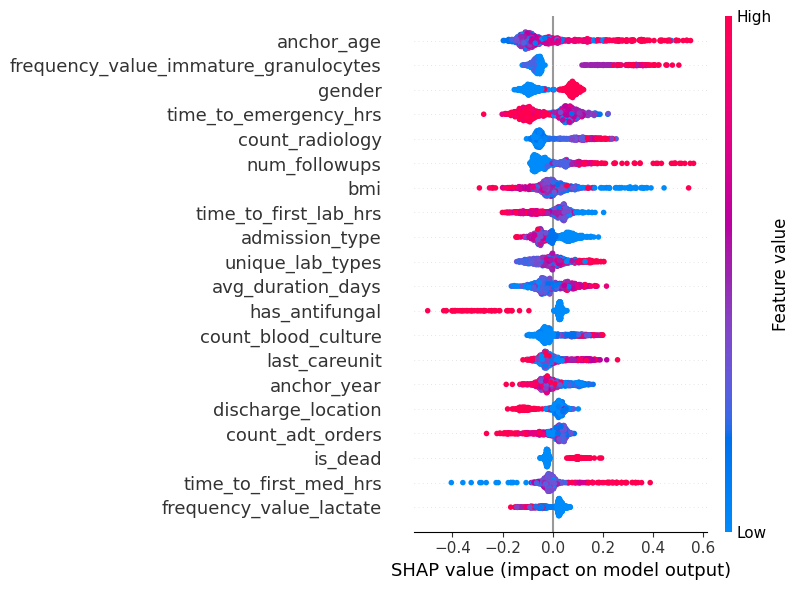

In [ ]:
#SHAP Summary plot
shap.summary_plot(shap_values_common_skin, X_test_common_skin_df, plot_size=(8, 6), max_display=20)

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_skin_df.index.get_loc(3148)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_skin_df.loc[3148]
shap_values_for_instance = shap_values_common_skin[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common_skin.expected_value, shap_values_for_instance, instance)

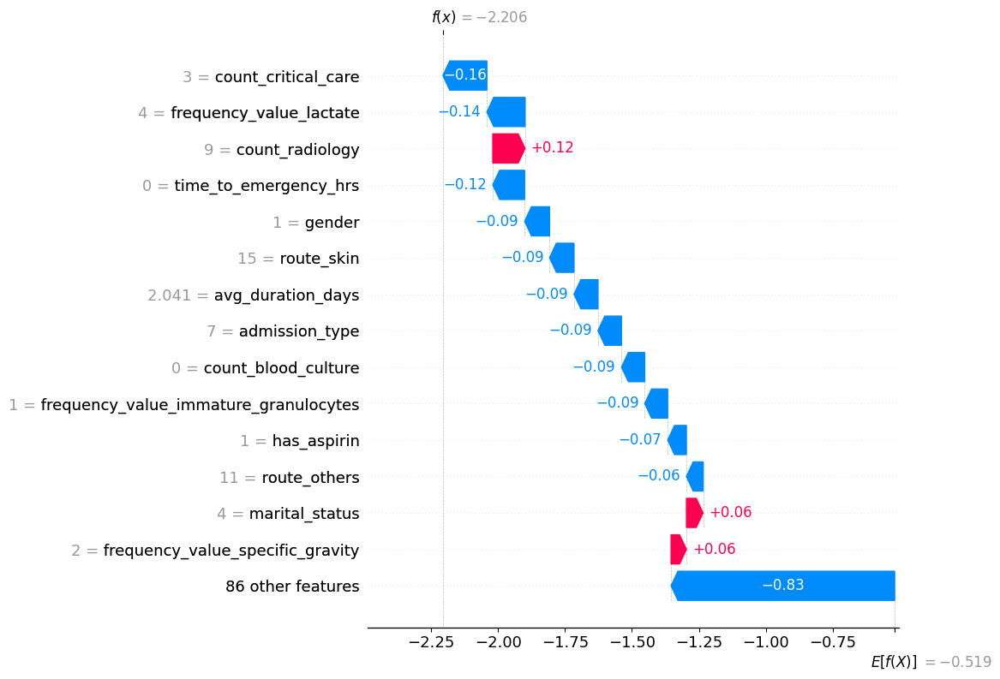

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_common_skin.expected_value,
                                     data=instance, feature_names=X_test_common_skin_df.columns.tolist()), max_display=15)

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_skin_df.index.get_loc(424)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_skin_df.loc[424]
shap_values_for_instance = shap_values_common_skin[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common_skin.expected_value, shap_values_for_instance, instance)

#This 424 is +ve in all three datasets

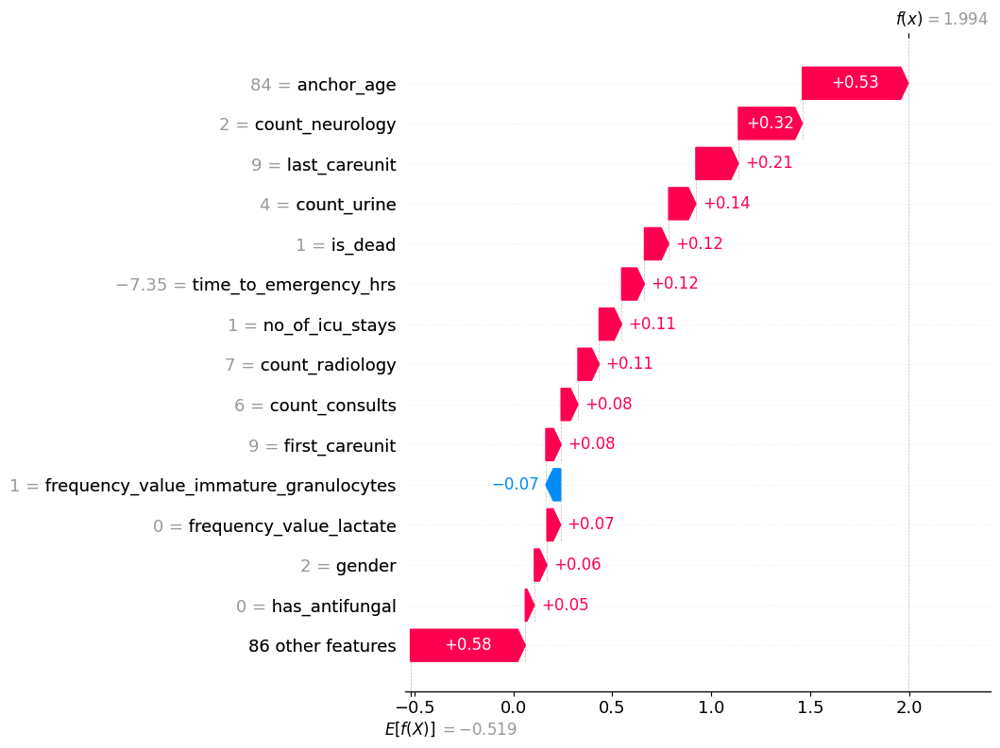

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_common_skin.expected_value,
                                     data=instance, feature_names=X_test_common_skin_df.columns.tolist()), max_display=15)

In [ ]:
#Creating an anchor explainer object by providing feature names, categorical mapping, output values and training data
anchor_explainer_common_skin = anchor_tabular.AnchorTabularExplainer(['Common Skin Disease','Rare Skin Disease'],
                                                                feature_names_common_skin,X_train_common_skin_df.values,categorical_names=cat_map)

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_common_skin.explain_instance(X_test_common_skin_df.loc[424].to_numpy(), model3.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_common_skin.class_names[model3.predict(X_test_common_skin_df.loc[424].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF count_neurology > 0.00 AND count_urine > 1.00 AND anchor_age > 72.00 AND prn_med_count > 4.00 AND unique_medications > 13.00 AND los > 2.05 AND has_heparin <= 1.00 AND has_analgesics <= 1.00 AND has_insulin <= 0.00 AND has_abnormal_metabolic_acidbase <= 1.00 AND 0.00 < no_of_ed_transfers <= 1.00 AND has_antibiotics <= 1.00 AND has_abnormal_hematologic <= 1.00 AND has_abnormal_rbc_indices <= 1.00 AND has_vaccine <= 1.00 AND is_night_admit <= 1.00 AND anchor_year_start <= 2017.00 AND has_topical <= 1.00 AND has_pain_management <= 1.00 AND has_statins <= 1.00 AND has_fluids <= 1.00 AND count_tpn <= 0.00 AND count_iv_therapy > 2.00 AND route_iv > 3.00 AND count_radiology > 3.00 AND first_careunit > 5.00 AND last_careunit > 7.00 AND time_to_emergency_hrs <= -4.02 AND frequency_value_lactate <= 1.00 AND time_to_first_lab_hrs <= 0.08 AND has_antifungal <= 0.00 AND no_of_unique_procedures <= 0.00 AND gender = Female THEN Rare Skin Disease
Precision: 0.98
Coverage: 0.00


In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_common_skin.explain_instance(X_test_common_skin_df.loc[3148].to_numpy(), model3.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_common_skin.class_names[model3.predict(X_test_common_skin_df.loc[3148].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF time_to_first_med_hrs <= 1.15 AND count_consults <= 2.00 AND count_critical_care > 0.00 THEN Common Skin Disease
Precision: 0.95
Coverage: 0.01


## 2. Prediction Interpretability with Misclassified Cases

This part is to discuss about the false positives and false negatives, especially the anomalous cases with greater than 90% prediction probability using COUNTERFACTUALs

#### 2.1 Common Disorders vs Rare Skin Disorders

In [ ]:
#Getting some false positive records
results_common_df[results_common_df['pred_type']=='FP']

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
3474,1.000,53.000,2114.000,4.000,3.000,2.000,3.000,1.000,2.000,1.000,0.000,0.000,0.000,5.992,1.000,-17.200,2.000,0.000,0.000,1.000,1.000,27.900,0.000,2.000,1.000,3.000,3.000,0.000,4.000,0.000,0.000,2.000,0.000,16.000,0.000,1.000,0.000,2.000,0.000,4.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,8.000,16.000,2.000,3.000,24.000,8.000,0.000,403.824,5000.000,3.304,5.958,1.000,1.000,1.000,0.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,4.317,3.000,1.000,33.000,8.000,NaN,NaN,NaN,0.000,0.000,0.000,0.000,13.633,14.017,2014.000,2016.000,1.000,1.000,1.000,1.000,1.000,1.000,0,1,0.790,0.210,FP
3424,2.000,58.000,2181.000,4.000,3.000,2.000,3.000,1.000,1.000,1.000,0.000,2.000,0.000,8.863,4.000,0.000,10.000,0.000,0.000,1.000,0.000,28.300,2.000,1.000,0.000,3.000,3.000,0.000,3.000,0.000,0.000,2.000,0.000,6.000,0.000,2.000,0.000,10.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,5.000,14.000,3.000,11.000,17.000,10.000,0.000,277.183,5000.000,5.649,8.958,1.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.850,1.000,1.000,44.000,7.000,NaN,NaN,NaN,1.000,1.000,0.000,0.000,4.350,4.350,2011.000,2013.000,0.000,0.000,1.000,0.000,1.000,1.000,0,1,0.841,0.159,FP
3364,1.000,76.000,2176.000,1.000,2.000,2.000,3.000,1.000,1.000,1.000,0.000,0.000,0.000,1.853,4.000,0.000,11.000,1.000,1.000,3.000,3.000,28.900,0.000,1.000,0.000,3.000,3.000,0.000,8.000,0.000,0.000,0.000,0.000,11.000,0.000,1.000,0.000,2.000,0.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,20.000,10.000,3.000,25.000,13.000,0.000,242.697,5000.000,1.207,2.000,0.000,1.000,1.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,1.000,0.000,1.000,0.267,0.000,1.000,0.000,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,2017.000,2019.000,0.000,0.000,0.000,0.000,0.000,0.000,0,1,0.745,0.255,FP
3403,2.000,57.000,2125.000,1.000,1.000,2.000,1.000,2.000,3.000,4.000,0.000,0.000,0.000,8.363,4.000,-9.500,10.000,0.000,1.000,2.000,1.000,35.100,1.

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_df.index.get_loc(3424)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_df.loc[3424]
shap_values_for_instance = shap_values_common[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common.expected_value, shap_values_for_instance, instance)

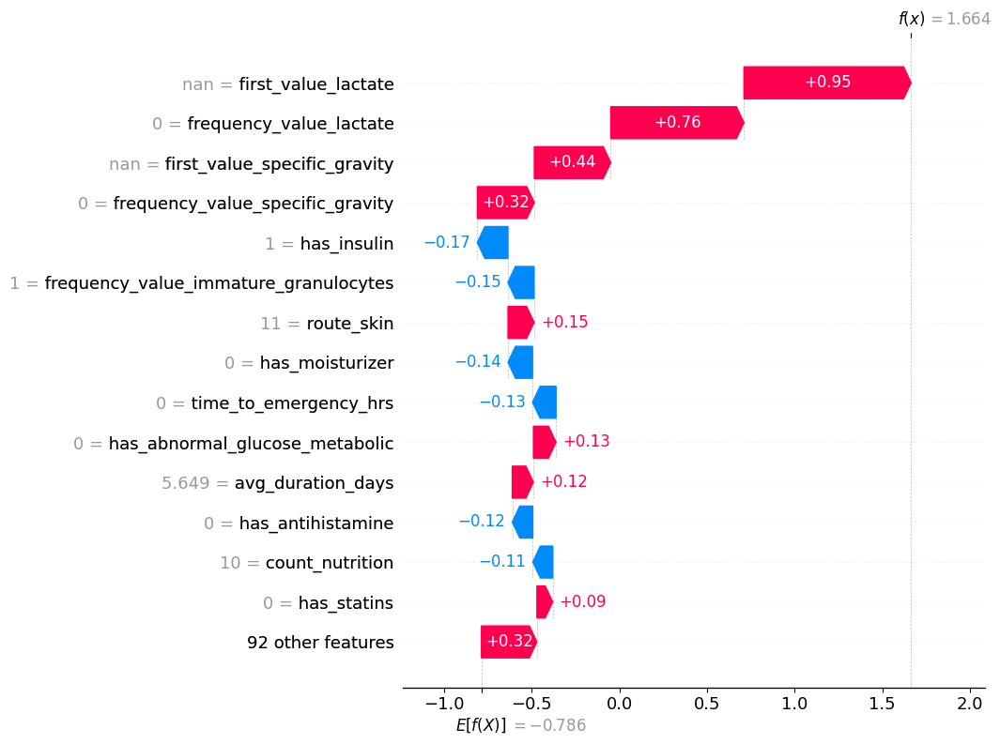

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_common.expected_value,
                                     data=instance, feature_names=X_test_common_df.columns.tolist()), max_display=15)

In [ ]:
#Anomalous records
fp_high_conf_common

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
3403,2.000,57.000,2125.000,1.000,1.000,2.000,1.000,2.000,3.000,4.000,0.000,0.000,0.000,8.363,4.000,-9.500,10.000,0.000,1.000,2.000,1.000,35.100,1.000,2.000,1.000,3.000,12.000,0.000,5.000,0.000,0.000,5.000,0.000,9.000,0.000,9.000,0.000,6.000,0.000,7.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,3.000,0.000,7.000,0.000,0.000,0.000,15.000,13.000,5.000,3.000,26.000,18.000,0.000,341.604,5000.000,4.226,8.292,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,5.700,5.000,1.000,49.000,8.000,NaN,NaN,NaN,1.000,2.000,0.000,0.000,22.567,22.567,2008.000,2010.000,1.000,0.000,1.000,0.000,1.000,1.000,0,1,0.983,0.017,FP
3271,1.000,65.000,2188.000,1.000,4.000,1.000,3.000,1.000,2.000,1.000,0.000,1.000,0.000,6.783,3.000,-5.933,8.000,0.000,0.000,3.000,1.000,29.700,0.000,2.000,1.000,3.000,3.000,0.000,7.000,4.000,0.000,1.000,0.000,8.000,0.000,1.000,0.000,12.000,0.000,5.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,4.000,0.000,0.000,0.000,4.000,19.000,1.000,0.000,17.000,9.000,0.000,151.004,1000.000,3.250,6.875,0.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,3.033,2.000,1.000,74.000,7.000,NaN,1.008,6.500,0.000,1.000,0.000,1.000,3.700,12.450,2017.000,2019.000,1.000,0.000,1.000,0.000,1.000,0.000,0,1,0.911,0.089,FP
3473,1.000,43.000,2193.000,2.000,1.000,3.000,3.000,2.000,2.000,4.000,0.000,0.000,1.000,10.963,2.000,-4.650,5.000,0.000,0.000,1.000,0.000,23.500,0.000,2.000,1.000,3.000,3.000,0.000,8.000,3.000,1.000,2.000,0.000,21.000,0.000,2.000,0.000,4.000,0.000,10.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,14.000,0.000,14.000,10.000,2.000,0.000,7.000,34.000,4.000,5.000,33.000,8.000,0.000,305.240,5000.000,6.418,11.583,1.000,1.000,1.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,1.000,0.000,-10.383,2.000,1.000,27.000,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,6.633,6.633,2008.000,2010.000,1.000,1.000,1.000,1.000,0.000,1.000,0,1,0.961,0.039,FP
3504,2.000,89.000,2176.000,2.000,2.000,4.000,3.000,1.000,5.000,6.000,1.000,0.000,1.000,11.205,1.000,-2.133,2.000,0.000,0.000,6.000,2.0

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_df.index.get_loc(3403)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_df.loc[3403]
shap_values_for_instance = shap_values_common[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common.expected_value, shap_values_for_instance, instance)

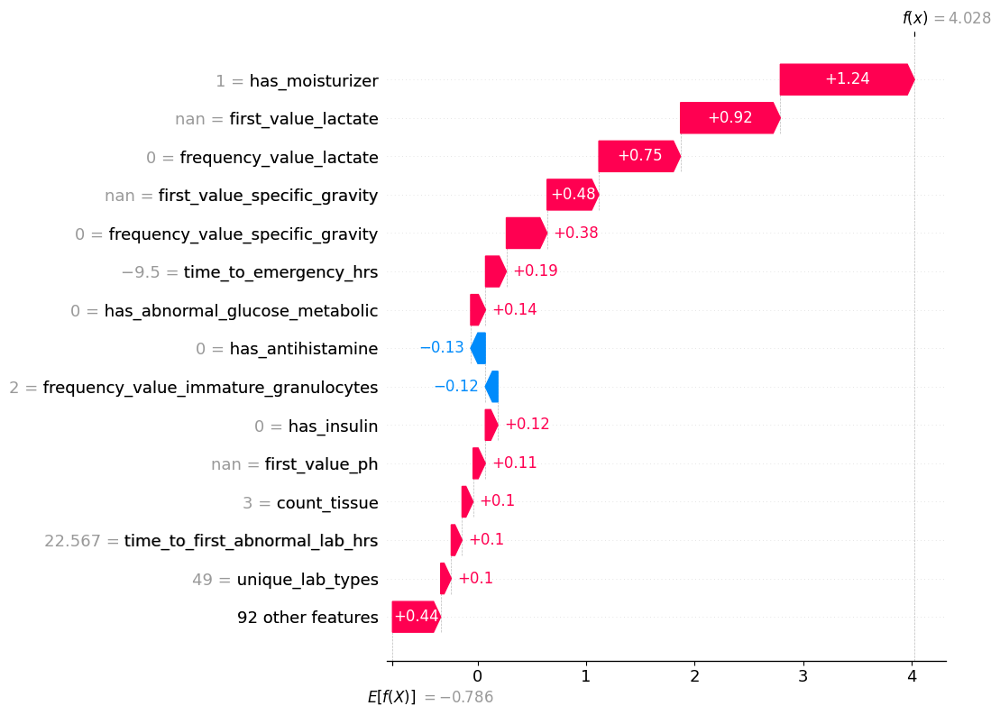

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_common.expected_value,
                                     data=instance, feature_names=X_test_common_df.columns.tolist()), max_display=15)

In [ ]:
#Getting some false negative records
results_common_df[results_common_df['pred_type']=='FN']

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
998,2.000,85.000,2154.000,1.000,1.000,4.000,3.000,1.000,5.000,1.000,1.000,0.000,1.000,26.370,2.000,-5.050,3.000,1.000,0.000,1.000,1.000,24.900,9.000,6.000,1.000,3.000,3.000,1.000,14.000,0.000,4.000,5.000,0.000,66.000,0.000,18.000,0.000,12.000,0.000,20.000,2.000,0.000,0.000,0.000,36.000,0.000,2.000,0.000,3.000,45.000,15.000,1.000,2.000,40.000,41.000,16.000,6.000,52.000,31.000,2.000,231.228,5000.000,4.722,25.375,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,3.117,5.000,1.000,106.000,4.000,1.500,1.030,5.500,14.000,6.000,2.000,2.000,-2.983,-2.983,2017.000,2019.000,1.000,0.000,1.000,0.000,1.000,1.000,1,0,0.291,0.709,FN
1270,1.000,31.000,2114.000,1.000,1.000,7.000,2.000,1.000,5.000,6.000,0.000,0.000,0.000,2.527,3.000,-1.050,7.000,1.000,1.000,1.000,1.000,27.900,0.000,2.000,1.000,14.000,14.000,1.000,3.000,0.000,1.000,4.000,0.000,6.000,0.000,8.000,0.000,2.000,0.000,1.000,2.000,0.000,0.000,0.000,4.000,0.000,0.000,0.000,0.000,5.000,4.000,0.000,0.000,10.000,30.000,3.000,2.000,31.000,12.000,0.000,250.592,5000.000,1.883,2.625,1.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,1.000,0.000,0.000,2.400,4.000,1.000,57.000,11.000,0.800,NaN,7.340,1.000,1.000,2.000,0.000,2.700,2.700,2014.000,2016.000,1.000,1.000,1.000,0.000,1.000,1.000,1,0,0.319,0.681,FN
920,2.000,59.000,2138.000,2.000,1.000,3.000,1.000,1.000,2.000,1.000,0.000,0.000,0.000,35.890,2.000,-2.900,4.000,1.000,0.000,10.000,6.000,20.700,1.000,3.000,1.000,14.000,3.000,1.000,5.000,14.000,5.000,14.000,3.000,104.000,0.000,51.000,0.000,29.000,0.000,69.000,37.000,0.000,0.000,14.000,7.000,2.000,9.000,0.000,6.000,51.000,12.000,0.000,1.000,180.000,71.000,15.000,13.000,69.000,45.000,1.000,269.822,5000.000,5.278,34.875,1.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,1.000,0.000,0.000,-12.850,17.000,1.000,147.000,12.000,2.600,1.036,7.340,10.000,1.000,30.000,8.000,1.633,1.633,2017.000,2019.000,1.000,1.000,1.000,0.000,0.000,1.000,1,0,0.144,0.856,FN
497,1.000,61.000,2128.000,6.000,2.000,2.000,3.000,1.000,1.000,1.000,0.000,0.000,0.000,4.58

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_df.index.get_loc(497)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_df.loc[497]
shap_values_for_instance = shap_values_common[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common.expected_value, shap_values_for_instance, instance)

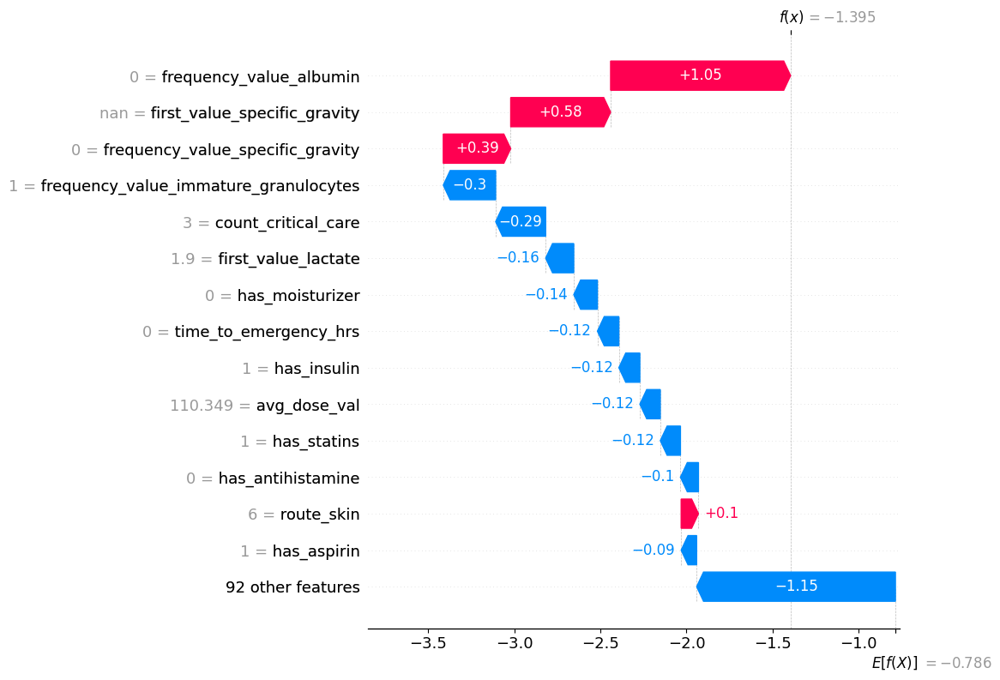

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_common.expected_value,
                                     data=instance, feature_names=X_test_common_df.columns.tolist()), max_display=15)

In [ ]:
fn_high_conf_common

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
832,1.000,67.000,2165.000,1.000,3.000,5.000,1.000,1.000,1.000,1.000,0.000,0.000,0.000,6.767,2.000,-17.267,4.000,0.000,1.000,1.000,0.000,28.000,0.000,2.000,1.000,3.000,7.000,0.000,4.000,0.000,3.000,4.000,0.000,22.000,0.000,5.000,0.000,6.000,0.000,6.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,6.000,6.000,6.000,0.000,0.000,7.000,16.000,3.000,2.000,20.000,11.000,0.000,497.650,5000.000,3.779,6.875,0.000,1.000,0.000,1.000,1.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,1.000,0.000,1.817,2.000,1.000,90.000,5.000,1.200,1.016,6.000,1.000,1.000,1.000,2.000,-16.517,-16.517,2017.000,2019.000,1.000,0.000,0.000,1.000,0.000,0.000,1,0,0.068,0.932,FN
286,2.000,57.000,2130.000,4.000,4.000,5.000,1.000,1.000,2.000,1.000,0.000,2.000,0.000,4.600,4.000,-11.483,9.000,1.000,0.000,0.000,0.000,28.000,1.000,3.000,1.000,14.000,9.000,1.000,6.000,0.000,0.000,3.000,0.000,17.000,0.000,7.000,3.000,2.000,0.000,6.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,16.000,13.000,3.000,6.000,22.000,12.000,0.000,218.235,5000.000,2.293,4.708,1.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,2.350,2.000,1.000,79.000,32.000,2.800,1.027,5.500,2.000,1.000,1.000,1.000,-10.400,-10.400,2008.000,2010.000,1.000,1.000,1.000,1.000,0.000,1.000,1,0,0.079,0.921,FN
1300,1.000,34.000,2121.000,1.000,2.000,1.000,2.000,1.000,2.000,2.000,0.000,0.000,0.000,4.020,1.000,-24.100,1.000,0.000,0.000,0.000,0.000,24.300,0.000,2.000,1.000,9.000,9.000,0.000,4.000,0.000,0.000,0.000,0.000,5.000,0.000,2.000,2.000,2.000,0.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.000,9.000,2.000,1.000,12.000,5.000,0.000,545.073,5000.000,3.203,4.125,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,-7.417,2.000,1.000,89.000,15.000,1.900,1.021,7.000,1.000,1.000,1.000,1.000,-23.550,-23.550,2008.000,2010.000,0.000,0.000,1.000,1.000,1.000,1.000,1,0,0.072,0.928,FN
588,2.000,86.000,2170.000,1.000,3.000,3.000,1.000,1.000,1.000,1.000,0.000,0.000,0.000,12.894,4.000,-4.217,10.000,0

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_df.index.get_loc(91)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_df.loc[91]
shap_values_for_instance = shap_values_common[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common.expected_value, shap_values_for_instance, instance)

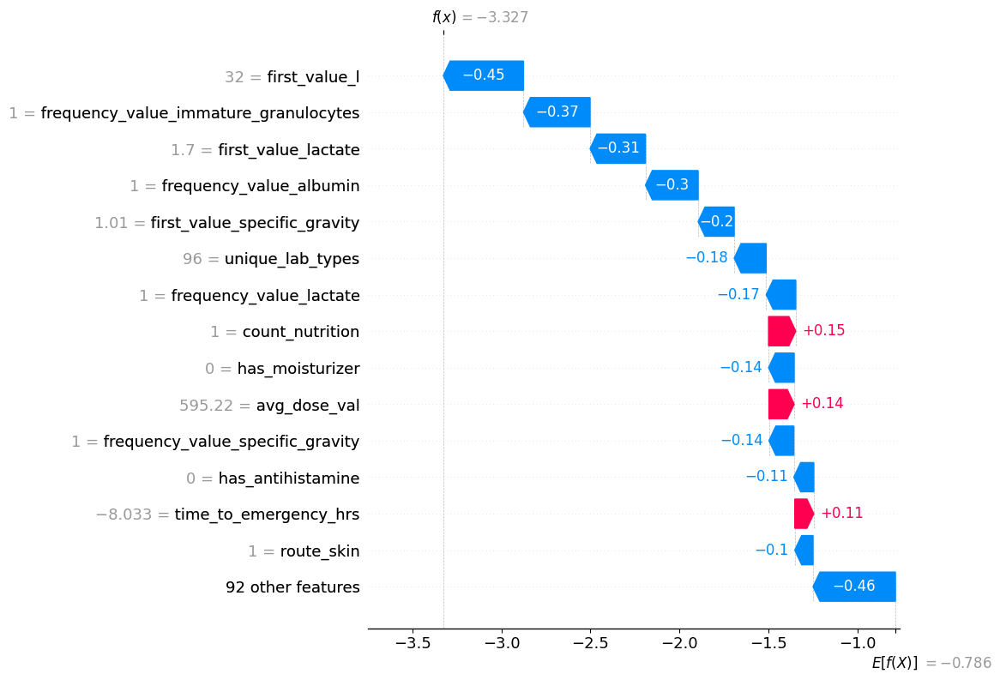

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_common.expected_value,
                                     data=instance, feature_names=X_test_common_df.columns.tolist()), max_display=15)

#### 2.2 Rare Disorders vs Rare Skin Disorders

In [ ]:
#Getting some false positive records
results_rare_df[results_rare_df['pred_type']=='FP']

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_urea_nitrogen,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
3505,1.000,75.000,2169.000,8.000,2.000,3.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,6.030,3.000,0.000,6.000,0.000,0.000,1.000,0.000,23.500,0.000,1.000,0.000,3.000,3.000,0.000,5.000,1.000,0.000,2.000,0.000,11.000,0.000,2.000,0.000,13.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,13.000,4.000,33.000,3.000,1.000,31.000,4.000,13.000,69.932,1000.000,2.424,6.167,0.000,1.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,1.000,0.000,0.000,1.000,0.000,-4.017,3.000,1.000,39.000,8.000,NaN,NaN,17.000,NaN,0.000,1.000,0.000,0.000,0.650,0.650,2011.000,2013.000,1.000,0.000,1.000,0.000,1.000,0.000,0,1,0.855,0.145,FP
3418,1.000,73.000,2184.000,1.000,2.000,1.000,1.000,1.000,1.000,1.000,0.000,0.000,0.000,3.005,2.000,-2.683,5.000,0.000,1.000,2.000,2.000,31.900,2.000,4.000,1.000,10.000,5.000,0.000,6.000,0.000,0.000,0.000,0.000,14.000,0.000,2.000,0.000,4.000,0.000,2.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,1.000,12.000,2.000,0.000,14.000,1.000,2.000,56.300,650.000,0.324,0.792,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,57.950,0.000,1.000,30.000,8.000,NaN,NaN,17.000,NaN,0.000,0.000,0.000,0.000,4.633,48.283,2011.000,2013.000,0.000,0.000,1.000,0.000,1.000,0.000,0,1,0.868,0.132,FP
3402,1.000,22.000,2145.000,3.000,1.000,14.000,3.000,1.000,2.000,1.000,0.000,0.000,0.000,0.409,3.000,-3.333,7.000,0.000,1.000,0.000,0.000,27.900,0.000,2.000,1.000,13.000,13.000,0.000,1.000,0.000,0.000,0.000,0.000,8.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,2017.000,2019.000,0.000,0.000,0.000,0.000,0.000,0.000,0,1,0.896,0.104,FP
3424,2.000,66.000,2148.000,2.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,4.564,2.000,-3.367,5.000

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_rare_df.index.get_loc(3424)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[3424]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

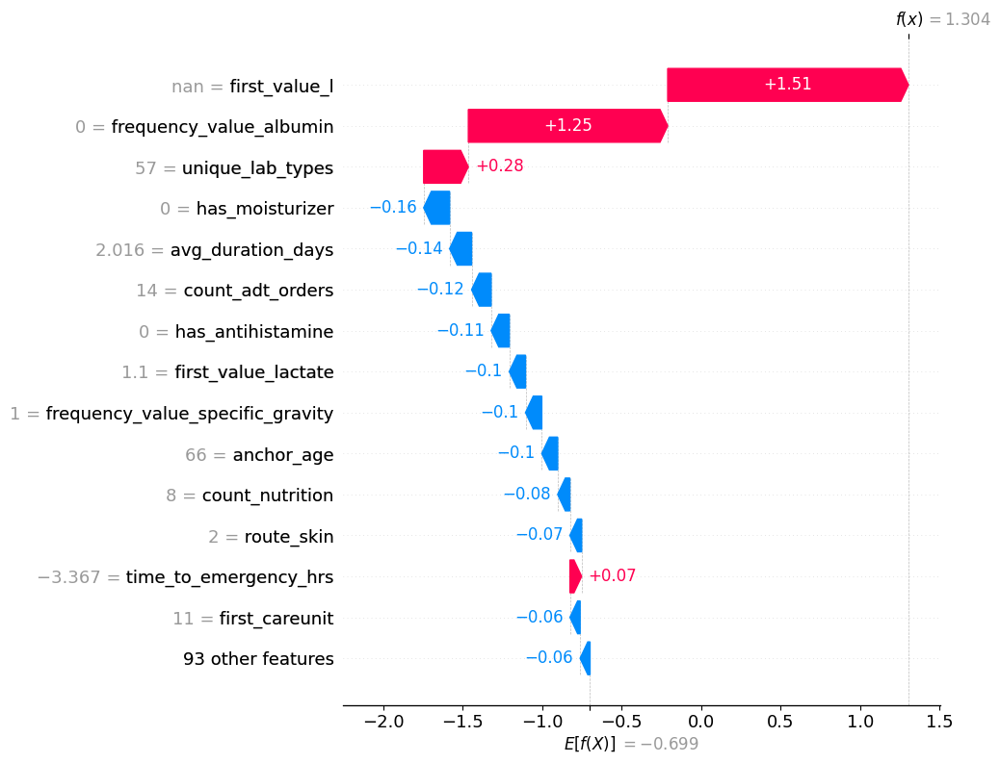

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_rare.expected_value,
                                     data=instance, feature_names=X_test_rare_df.columns.tolist()), max_display=15)

In [ ]:
fp_high_conf_rare

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_urea_nitrogen,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
3444,2.000,91.000,2184.000,4.000,7.000,2.000,1.000,1.000,4.000,1.000,0.000,0.000,0.000,2.864,1.000,-5.900,2.000,0.000,0.000,0.000,0.000,20.800,0.000,2.000,1.000,3.000,3.000,0.000,5.000,0.000,1.000,2.000,0.000,12.000,0.000,4.000,0.000,2.000,0.000,6.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,9.000,2.000,1.000,12.000,2.000,0.000,480.362,5000.000,1.979,2.875,0.000,1.000,1.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,3.183,1.000,1.000,24.000,6.000,NaN,NaN,17.000,NaN,0.000,0.000,0.000,0.000,10.683,10.683,2017.000,2019.000,1.000,0.000,1.000,0.000,0.000,0.000,0,1,0.907,0.093,FP
3411,2.000,59.000,2167.000,2.000,2.000,1.000,3.000,1.000,1.000,1.000,0.000,2.000,0.000,5.634,2.000,-2.783,3.000,1.000,0.000,0.000,0.000,36.200,0.000,2.000,1.000,4.000,4.000,0.000,4.000,4.000,5.000,1.000,0.000,10.000,0.000,3.000,0.000,2.000,0.000,2.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,3.000,0.000,0.000,0.000,12.000,28.000,1.000,2.000,28.000,5.000,0.000,424.328,5000.000,1.659,5.625,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,3.417,6.000,1.000,78.000,14.000,NaN,NaN,20.000,NaN,5.000,0.000,0.000,0.000,6.433,6.500,2008.000,2010.000,1.000,1.000,1.000,0.000,1.000,0.000,0,1,0.943,0.057,FP
3478,2.000,52.000,2152.000,2.000,1.000,2.000,1.000,1.000,2.000,1.000,0.000,1.000,1.000,32.851,4.000,-7.567,11.000,1.000,0.000,7.000,7.000,30.500,0.000,2.000,1.000,3.000,3.000,0.000,12.000,3.000,2.000,4.000,0.000,79.000,0.000,23.000,0.000,28.000,0.000,22.000,2.000,0.000,0.000,21.000,0.000,0.000,0.000,0.000,0.000,28.000,12.000,5.000,0.000,24.000,48.000,3.000,5.000,39.000,21.000,0.000,312.269,5000.000,7.441,32.583,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,4.417,8.000,1.000,65.000,20.000,NaN,NaN,12.000,NaN,9.000,10.000,0.000,0.000,9.083,9.083,2011.000,2013.000,1.000,0.000,1.000,1.000,1.000,0.000,0,1,0.966,0.034,FP
3475,2.000,62.000,2175.000,1.000,5.000,3.000,1.000,1.000,2.000,1.000,0.000,0.000,0.000

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_rare_df.index.get_loc(3411)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[3411]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

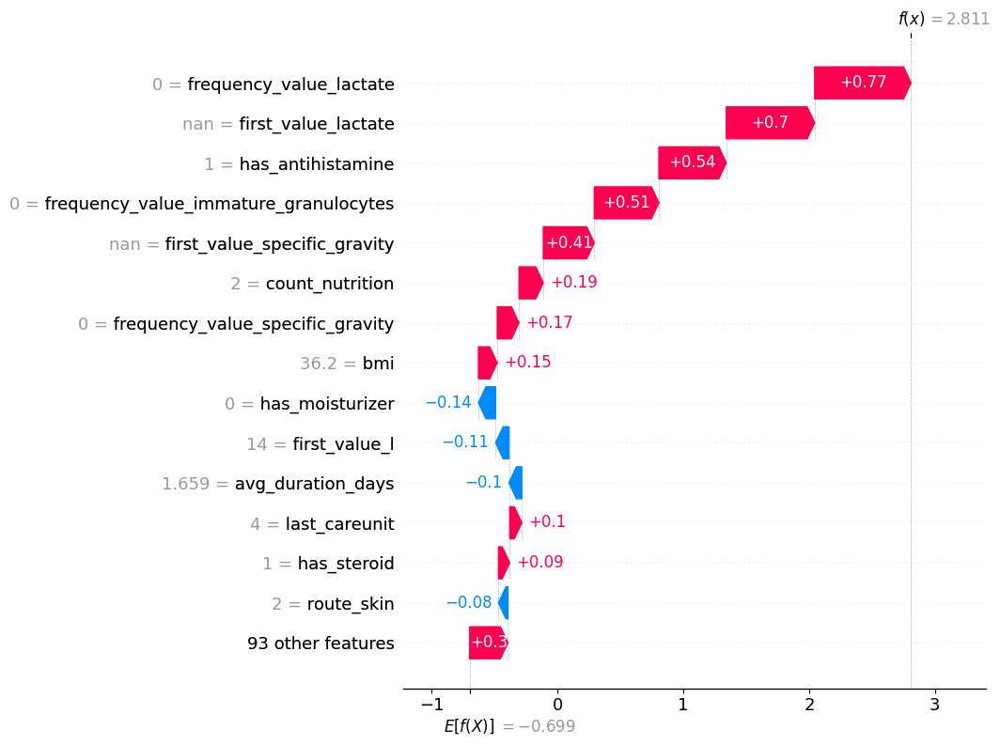

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_rare.expected_value,
                                     data=instance, feature_names=X_test_rare_df.columns.tolist()), max_display=15)

In [ ]:
#Getting some false negative records
results_rare_df[results_rare_df['pred_type']=='FN']

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_urea_nitrogen,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
1013,2.000,51.000,2135.000,1.000,3.000,3.000,3.000,1.000,5.000,1.000,0.000,0.000,0.000,59.681,1.000,0.000,12.000,1.000,0.000,8.000,5.000,28.100,6.000,5.000,0.000,16.000,3.000,1.000,18.000,13.000,11.000,13.000,0.000,69.000,23.000,61.000,0.000,31.000,0.000,20.000,0.000,0.000,0.000,6.000,0.000,0.000,0.000,0.000,1.000,12.000,1.000,0.000,0.000,134.000,61.000,56.000,15.000,61.000,72.000,0.000,651.330,5000.000,5.502,58.875,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000,0.000,0.000,23.000,12.000,1.000,140.000,7.000,1.600,1.009,51.000,7.000,30.000,4.000,15.000,5.000,23.183,23.183,2017.000,2019.000,1.000,1.000,1.000,0.000,1.000,1.000,1,0,0.101,0.899,FN
647,2.000,61.000,2113.000,4.000,3.000,4.000,3.000,1.000,5.000,6.000,1.000,0.000,1.000,28.115,1.000,0.000,12.000,1.000,1.000,7.000,6.000,13.600,2.000,3.000,0.000,7.000,14.000,1.000,7.000,11.000,14.000,9.000,0.000,85.000,0.000,41.000,0.000,19.000,0.000,47.000,71.000,30.000,0.000,18.000,8.000,8.000,0.000,0.000,6.000,63.000,7.000,0.000,2.000,167.000,29.000,29.000,6.000,67.000,25.000,2.000,277.048,5000.000,4.602,28.208,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000,0.000,0.000,1.783,13.000,1.000,153.000,5.000,3.300,1.005,2.000,7.320,10.000,1.000,39.000,3.000,2.983,2.983,2017.000,2019.000,1.000,0.000,1.000,1.000,1.000,1.000,1,0,0.065,0.935,FN
827,2.000,61.000,2142.000,4.000,3.000,5.000,3.000,1.000,5.000,6.000,0.000,0.000,0.000,29.819,4.000,0.000,9.000,1.000,1.000,5.000,1.000,38.000,6.000,3.000,0.000,14.000,4.000,2.000,9.000,11.000,9.000,27.000,1.000,119.000,0.000,28.000,0.000,34.000,0.000,30.000,24.000,0.000,3.000,7.000,0.000,0.000,22.000,42.000,2.000,84.000,52.000,12.000,1.000,99.000,64.000,11.000,46.000,67.000,21.000,1.000,175.018,5200.000,4.323,30.000,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,0.833,14.000,1.000,134.000,20.000,1.400,1.009,47.000,7.270,11.000,0.000,18.000,2.000,1.567,1.567,2017.000,2019.000,1.000,1.000,1.000,1.000,1.000,1.000,1,0,0.358,0.642,FN
920,2.000,59.000,2138

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_rare_df.index.get_loc(775)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[775]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

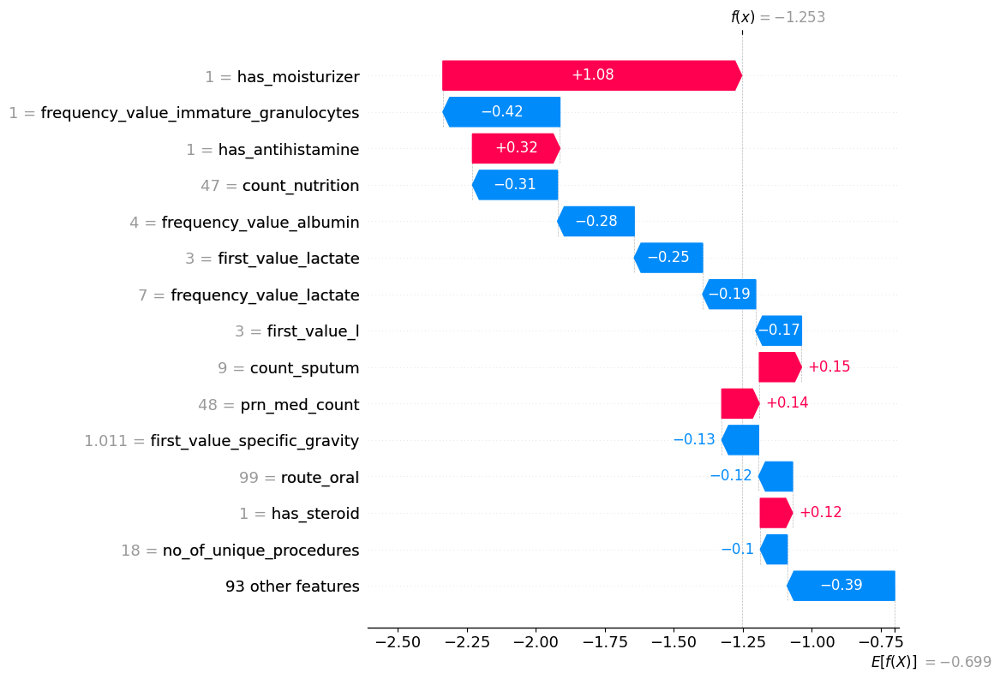

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_rare.expected_value,
                                     data=instance, feature_names=X_test_rare_df.columns.tolist()), max_display=15)

In [ ]:
fn_high_conf_rare

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_urea_nitrogen,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
647,2.000,61.000,2113.000,4.000,3.000,4.000,3.000,1.000,5.000,6.000,1.000,0.000,1.000,28.115,1.000,0.000,12.000,1.000,1.000,7.000,6.000,13.600,2.000,3.000,0.000,7.000,14.000,1.000,7.000,11.000,14.000,9.000,0.000,85.000,0.000,41.000,0.000,19.000,0.000,47.000,71.000,30.000,0.000,18.000,8.000,8.000,0.000,0.000,6.000,63.000,7.000,0.000,2.000,167.000,29.000,29.000,6.000,67.000,25.000,2.000,277.048,5000.000,4.602,28.208,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000,0.000,0.000,1.783,13.000,1.000,153.000,5.000,3.300,1.005,2.000,7.320,10.000,1.000,39.000,3.000,2.983,2.983,2017.000,2019.000,1.000,0.000,1.000,1.000,1.000,1.000,1,0,0.065,0.935,FN
920,2.000,59.000,2138.000,2.000,1.000,3.000,1.000,1.000,2.000,1.000,0.000,0.000,0.000,35.890,2.000,-2.900,4.000,1.000,0.000,10.000,6.000,20.700,1.000,3.000,1.000,14.000,3.000,1.000,5.000,14.000,5.000,14.000,3.000,104.000,0.000,51.000,0.000,29.000,0.000,69.000,37.000,0.000,0.000,14.000,7.000,2.000,9.000,0.000,6.000,51.000,12.000,0.000,1.000,180.000,71.000,15.000,13.000,69.000,45.000,1.000,269.822,5000.000,5.278,34.875,1.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,1.000,0.000,0.000,-12.850,17.000,1.000,147.000,12.000,2.600,1.036,35.000,7.340,10.000,1.000,30.000,8.000,1.633,1.633,2017.000,2019.000,1.000,1.000,1.000,0.000,0.000,1.000,1,0,0.064,0.936,FN
236,2.000,58.000,2183.000,7.000,2.000,5.000,3.000,1.000,1.000,1.000,0.000,1.000,0.000,43.354,2.000,0.000,3.000,0.000,0.000,22.000,9.000,20.100,8.000,3.000,0.000,11.000,3.000,1.000,9.000,53.000,5.000,9.000,3.000,159.000,13.000,50.000,0.000,41.000,0.000,70.000,55.000,3.000,0.000,9.000,3.000,8.000,0.000,0.000,10.000,48.000,13.000,0.000,1.000,173.000,78.000,31.000,26.000,85.000,60.000,1.000,324.195,5000.000,4.998,41.792,1.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,0.750,21.000,1.000,144.000,5.000,0.900,1.024,12.000,5.500,6.000,3.000,45.000,5.000,20.250,20.250,2017.000,2019.000,1.000,1.000,1.000,0.000,0.000,0.000,1,0,0.059,0.941,FN
1404,2.000,76.000,21

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_rare_df.index.get_loc(236)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[236]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

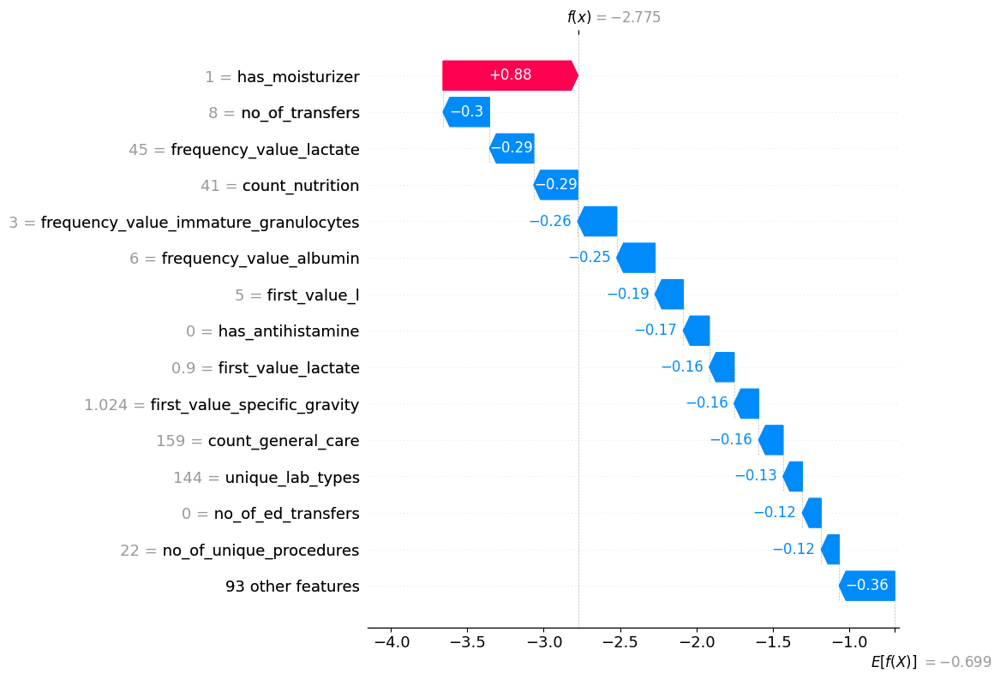

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_rare.expected_value,
                                     data=instance, feature_names=X_test_rare_df.columns.tolist()), max_display=15)

#### 2.3 Common Skin Disorders and Rare Skin Disorders

In [ ]:
#Getting the false positive records
results_common_skin_df[results_common_skin_df['pred_type']=='FP']

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
3286,1.000,67.000,2171.000,1.000,4.000,4.000,1.000,1.000,1.000,1.000,1.000,0.000,1.000,26.796,4.000,-5.133,9.000,0.000,0.000,16.000,11.000,23.800,5.000,5.000,1.000,5.000,14.000,1.000,7.000,5.000,9.000,8.000,4.000,115.000,3.000,48.000,4.000,22.000,0.000,69.000,55.000,0.000,0.000,12.000,12.000,1.000,0.000,0.000,4.000,60.000,5.000,0.000,2.000,175.000,78.000,27.000,10.000,81.000,41.000,2.000,3.382,26.042,1.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,1.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,1.000,2.850,15.000,1.000,140.000,1.000,6.000,71.000,4.000,4.183,15.100,2017.000,2019.000,0.000,0.000,1.000,1.000,1.000,1.000,0,1,0.815,0.185,FP
2465,2.000,50.000,2166.000,1.000,2.000,1.000,1.000,1.000,3.000,1.000,0.000,0.000,0.000,4.825,4.000,-4.367,11.000,0.000,1.000,0.000,0.000,27.000,0.000,2.000,1.000,3.000,3.000,0.000,4.000,0.000,0.000,1.000,0.000,5.000,0.000,2.000,0.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,0.000,0.000,13.000,15.000,13.000,5.000,0.000,3.000,10.000,1.000,1.000,14.000,3.000,0.000,4.214,4.833,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,0.000,4.033,1.000,1.000,45.000,0.000,0.000,0.000,1.000,3.050,3.050,2008.000,2010.000,0.000,0.000,0.000,0.000,1.000,1.000,0,1,0.537,0.463,FP
1983,2.000,71.000,2151.000,4.000,3.000,3.000,1.000,1.000,5.000,1.000,0.000,2.000,0.000,8.650,1.000,0.000,2.000,1.000,1.000,0.000,0.000,26.700,0.000,1.000,0.000,8.000,8.000,0.000,5.000,5.000,3.000,5.000,0.000,8.000,0.000,1.000,0.000,4.000,0.000,9.000,1.000,0.000,0.000,2.000,0.000,0.000,0.000,0.000,1.000,14.000,0.000,0.000,0.000,2.000,18.000,1.000,0.000,14.000,3.000,0.000,5.042,8.792,0.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.100,1.000,1.000,132.000,3.000,1.000,0.000,1.000,1.350,1.350,2017.000,2019.000,1.000,0.000,1.000,1.000,1.000,1.000,0,1,0.661,0.339,FP
2116,1.000,76.000,2181.000,4.000,3.000,7.000,1.000,1.000,1.000,1.000,0.000,2.000,0.000,39.822,3.000,0.000,7.000,1.000,0.000,13.000,6.000,48.200,5.000,3.000,0.000,3.000,12.000,2.000,7.000,3.000,6.000,6.000,0.000,172.000,2.000,63.000,0.000,55.000,0.000,46.000,37.000,0.000,0.000,9.000,0.000,1.000,0.000,0.000,17.000,30.000,13.000,5.000,

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_skin_df.index.get_loc(3286)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_skin_df.loc[3286]
shap_values_for_instance = shap_values_common_skin[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common_skin.expected_value, shap_values_for_instance, instance)

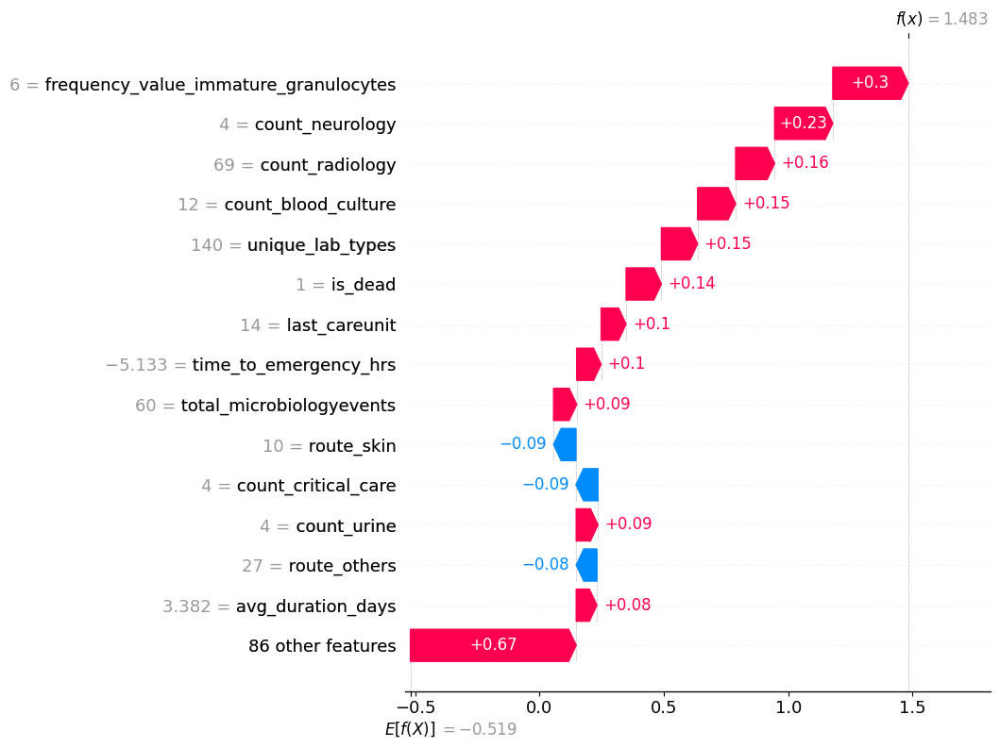

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_common_skin.expected_value,
                                     data=instance, feature_names=X_test_common_skin_df.columns.tolist()), max_display=15)

In [ ]:
fp_high_conf_common_skin

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
3465,1.000,51.000,2113.000,2.000,11.000,5.000,2.000,1.000,2.000,1.000,0.000,0.000,0.000,32.945,1.000,-3.683,12.000,1.000,0.000,13.000,7.000,27.900,2.000,4.000,1.000,14.000,9.000,1.000,10.000,7.000,6.000,10.000,7.000,120.000,0.000,48.000,15.000,42.000,0.000,80.000,43.000,0.000,0.000,16.000,13.000,0.000,0.000,0.000,10.000,57.000,2.000,0.000,1.000,164.000,47.000,13.000,9.000,68.000,35.000,1.000,3.577,33.000,1.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,0.000,2.733,13.000,1.000,134.000,8.000,5.000,26.000,11.000,5.017,5.017,2017.000,2019.000,1.000,1.000,1.000,1.000,1.000,1.000,0,1,0.923,0.077,FP


In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_skin_df.index.get_loc(3465)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_skin_df.loc[3465]
shap_values_for_instance = shap_values_common_skin[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common_skin.expected_value, shap_values_for_instance, instance)

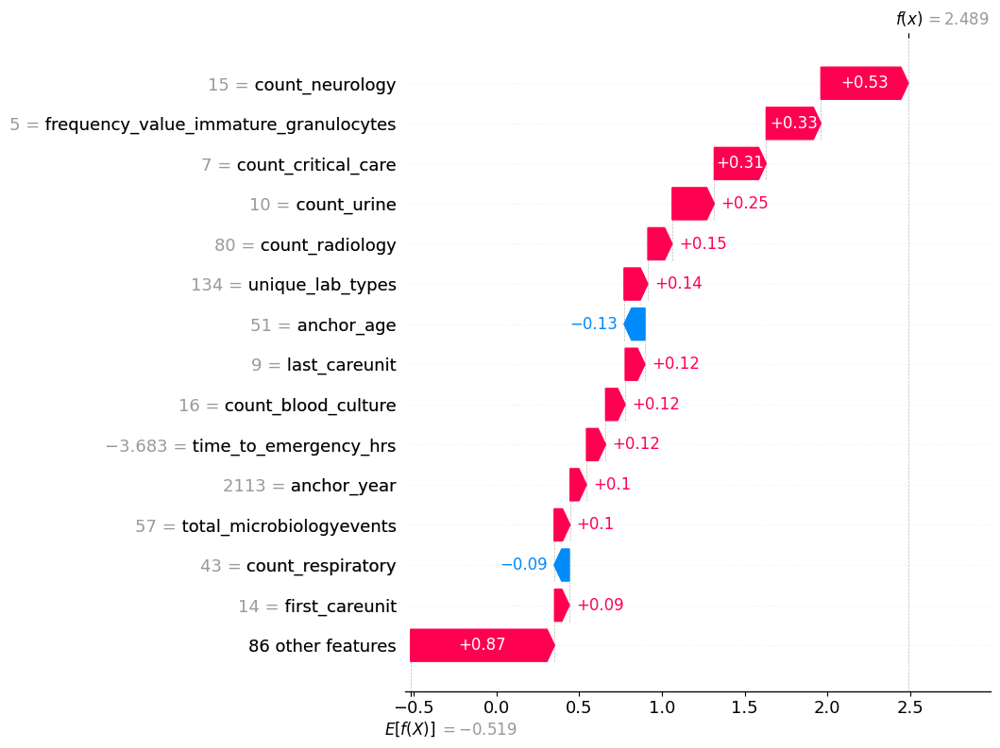

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_common_skin.expected_value,
                                     data=instance, feature_names=X_test_common_skin_df.columns.tolist()), max_display=15)

In [ ]:
#Getting the false negative records
results_common_skin_df[results_common_skin_df['pred_type']=='FN']

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
911,1.000,49.000,2190.000,2.000,1.000,7.000,3.000,1.000,2.000,1.000,0.000,1.000,0.000,44.406,3.000,-6.217,7.000,1.000,0.000,7.000,6.000,29.200,9.000,7.000,1.000,3.000,7.000,2.000,19.000,3.000,0.000,10.000,0.000,80.000,0.000,75.000,1.000,34.000,0.000,66.000,17.000,17.000,0.000,12.000,16.000,13.000,0.000,0.000,28.000,77.000,36.000,10.000,2.000,167.000,133.000,36.000,11.000,99.000,63.000,2.000,4.331,44.375,1.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,1.000,4.933,17.000,1.000,146.000,10.000,2.000,18.000,9.000,16.183,16.183,2011.000,2013.000,1.000,0.000,1.000,1.000,1.000,1.000,1,0,0.393,0.607,FN
1240,2.000,62.000,2187.000,3.000,4.000,14.000,3.000,1.000,2.000,3.000,0.000,2.000,1.000,5.019,4.000,-5.333,11.000,0.000,0.000,0.000,0.000,13.700,0.000,2.000,1.000,3.000,3.000,0.000,5.000,1.000,0.000,2.000,0.000,11.000,3.000,7.000,0.000,6.000,0.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,10.000,13.000,6.000,3.000,21.000,11.000,2.000,2.306,5.042,0.000,1.000,0.000,0.000,1.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,3.500,4.000,1.000,27.000,0.000,0.000,0.000,0.000,14.850,14.850,2014.000,2016.000,1.000,0.000,1.000,1.000,1.000,1.000,1,0,0.317,0.683,FN
492,2.000,29.000,2145.000,2.000,1.000,1.000,3.000,1.000,2.000,1.000,0.000,1.000,0.000,1.738,4.000,-3.767,10.000,1.000,0.000,0.000,0.000,19.000,3.000,3.000,1.000,13.000,3.000,0.000,5.000,0.000,0.000,0.000,0.000,9.000,0.000,2.000,0.000,2.000,0.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,9.000,7.000,1.000,2.000,14.000,7.000,0.000,0.558,0.958,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,22.883,1.000,1.000,19.000,0.000,0.000,0.000,0.000,31.883,31.883,2014.000,2016.000,0.000,0.000,1.000,0.000,0.000,1.000,1,0,0.414,0.586,FN
459,2.000,46.000,2129.000,1.000,2.000,1.000,3.000,1.000,2.000,2.000,0.000,0.000,0.000,6.772,2.000,-5.667,4.000,0.000,1.000,2.000,1.000,30.000,0.000,2.000,1.000,7.000,7.000,0.000,6.000,1.000,1.000,2.000,0.000,15.000,0.000,11.000,0.000,4.000,0.000,7.000,1.000,0.000,0.000,0.000,2.000,0.000,0.000,0.000,1.000,3.000,1.000,0.000,

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_skin_df.index.get_loc(1016)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_skin_df.loc[1016]
shap_values_for_instance = shap_values_common_skin[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common_skin.expected_value, shap_values_for_instance, instance)

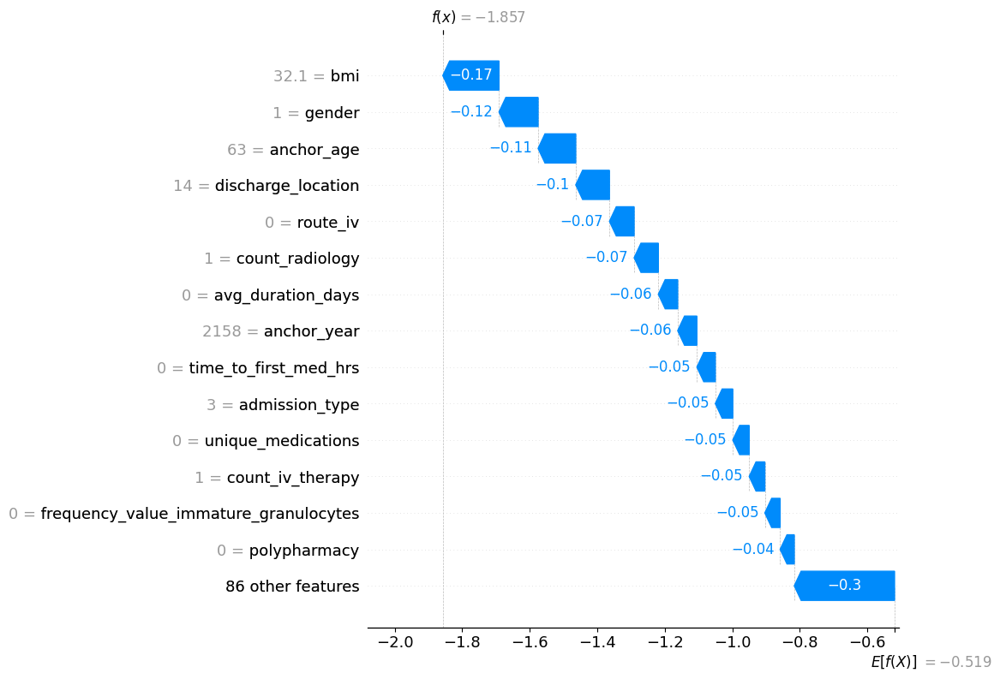

In [ ]:
#Generate a SHAP Waterfall plot with top 15 features
shap.waterfall_plot(shap.Explanation(values=shap_values_for_instance, base_values=explainer_shap_common_skin.expected_value,
                                     data=instance, feature_names=X_test_common_skin_df.columns.tolist()), max_display=15)

In [ ]:
fn_high_conf_common_skin

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type


## 3. Prediction Interpretability with Boundary Cases

This part is to discuss about the records, that are on the boundary, (0.50-0.55) using COUNTERFACTUALs. No need to do counterfactuals, explainerdashboard's what if is much better, use that.

#### 3.1 Common Disorders vs Rare Skin Disorders

In [ ]:
tp_boundary_common

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
444,1.000,70.000,2162.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,0.000,0.000,13.528,3.000,-3.033,8.000,1.000,1.000,2.000,0.000,25.100,2.000,3.000,1.000,3.000,4.000,0.000,7.000,3.000,0.000,1.000,0.000,8.000,0.000,5.000,0.000,5.000,0.000,6.000,1.000,0.000,0.000,16.000,0.000,0.000,0.000,0.000,1.000,45.000,0.000,0.000,0.000,15.000,18.000,4.000,5.000,28.000,9.000,0.000,443.553,5000.000,4.110,13.583,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,2.683,5.000,1.000,111.000,25.000,1.400,1.016,6.000,12.000,0.000,1.000,1.000,-1.483,-1.483,2017.000,2019.000,1.000,1.000,1.000,1.000,1.000,0.000,1,1,0.534,0.466,TP
50,2.000,57.000,2183.000,2.000,3.000,7.000,3.000,1.000,3.000,1.000,0.000,1.000,0.000,41.963,2.000,-1.650,4.000,0.000,0.000,11.000,7.000,19.100,4.000,3.000,1.000,14.000,9.000,1.000,6.000,6.000,3.000,18.000,7.000,145.000,0.000,59.000,26.000,36.000,0.000,71.000,21.000,0.000,0.000,27.000,28.000,5.000,6.000,0.000,6.000,113.000,37.000,6.000,3.000,144.000,71.000,10.000,15.000,64.000,34.000,3.000,364.083,5000.000,4.734,41.958,1.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.283,12.000,1.000,136.000,8.000,1.600,1.023,7.430,7.000,5.000,24.000,14.000,1.200,1.200,2017.000,2019.000,0.000,1.000,1.000,0.000,0.000,0.000,1,1,0.535,0.465,TP
285,2.000,80.000,2139.000,1.000,1.000,2.000,1.000,1.000,4.000,1.000,0.000,1.000,0.000,1.732,2.000,-7.833,4.000,1.000,0.000,0.000,0.000,20.500,0.000,2.000,1.000,5.000,5.000,0.000,12.000,0.000,0.000,1.000,0.000,13.000,0.000,3.000,0.000,2.000,0.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,19.000,0.000,2.000,18.000,7.000,1.000,305.443,5000.000,1.397,2.417,0.000,1.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,1.000,-12.367,0.000,1.000,27.000,12.000,NaN,NaN,NaN,0.000,0.000,0.000,0.000,14.967,14.967,2014.000,2016.000,1.000,1.000,1.000,1.000,1.000,0.000,1,1,0.544,0.456,TP
1100,2.000,56.000,2176.000,2.000,1.000,2.000,2.000,1.000,1.000,1.000,0.000,1.000,0.000,16.125,4.000,-1

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_df.index.get_loc(1362)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_df.loc[1362]
shap_values_for_instance = shap_values_common[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common.expected_value, shap_values_for_instance, instance)

In [ ]:
fp_boundary_common

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
2267,1.000,48.000,2159.000,1.000,2.000,1.000,2.000,2.000,2.000,4.000,0.000,0.000,0.000,20.199,2.000,-65.317,4.000,0.000,0.000,6.000,1.000,19.200,1.000,2.000,1.000,3.000,3.000,0.000,5.000,0.000,1.000,11.000,0.000,15.000,0.000,1.000,0.000,12.000,0.000,8.000,1.000,0.000,0.000,0.000,1.000,10.000,0.000,0.000,0.000,47.000,13.000,1.000,0.000,7.000,15.000,1.000,2.000,21.000,4.000,0.000,326.862,5000.000,6.828,20.250,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,2.783,3.000,1.000,160.000,22.000,1.100,1.017,6.500,6.000,2.000,1.000,2.000,-64.717,-64.717,2017.000,2019.000,1.000,0.000,1.000,0.000,1.000,0.000,0,1,0.519,0.481,FP
3358,2.000,76.000,2174.000,3.000,1.000,14.000,1.000,2.000,4.000,3.000,0.000,1.000,0.000,0.853,1.000,-6.500,2.000,1.000,0.000,0.000,0.000,24.400,1.000,2.000,1.000,3.000,3.000,0.000,6.000,1.000,1.000,1.000,0.000,7.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.000,12.000,2.000,1.000,17.000,3.000,0.000,124.185,1000.000,0.389,0.917,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,2.717,2.000,1.000,28.000,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,9.717,9.717,2008.000,2010.000,1.000,1.000,1.000,0.000,1.000,0.000,0,1,0.516,0.484,FP
3313,1.000,57.000,2168.000,5.000,2.000,14.000,3.000,1.000,3.000,2.000,0.000,0.000,0.000,1.769,4.000,-9.700,10.000,1.000,0.000,0.000,0.000,27.900,0.000,2.000,1.000,13.000,13.000,0.000,2.000,0.000,1.000,0.000,0.000,9.000,0.000,4.000,0.000,3.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,2014.000,2016.000,0.000,0.000,0.000,0.000,0.000,0.000,0,1,0.538,0.462,FP
3416,2.000,86.000,2147.000,2.000,1.000,1.000,3.000,1.000,4.000,1.000,0.000,0.000,0.000,2.767,3.000,-1.200,7.000,1.000,0.000,0.000,0.000,22.

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_df.index.get_loc(2267)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_df.loc[2267]
shap_values_for_instance = shap_values_common[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common.expected_value, shap_values_for_instance, instance)

In [ ]:
tn_boundary_common

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
2277,1.000,68.000,2111.000,2.000,3.000,4.000,1.000,1.000,1.000,1.000,1.000,0.000,1.000,29.274,3.000,-5.450,7.000,1.000,0.000,9.000,3.000,39.900,3.000,5.000,1.000,3.000,8.000,1.000,7.000,17.000,6.000,10.000,0.000,52.000,6.000,40.000,0.000,16.000,0.000,32.000,25.000,0.000,0.000,43.000,12.000,2.000,22.000,0.000,0.000,79.000,46.000,21.000,0.000,111.000,66.000,32.000,13.000,75.000,51.000,0.000,646.798,5000.000,5.411,24.417,1.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000,0.000,1.000,2.567,15.000,1.000,103.000,6.000,2.000,1.031,7.420,2.000,6.000,28.000,1.000,3.567,8.783,2017.000,2019.000,1.000,1.000,1.000,0.000,1.000,1.000,0,0,0.482,0.518,TN
3295,1.000,61.000,2142.000,1.000,1.000,1.000,3.000,1.000,1.000,1.000,0.000,0.000,0.000,2.658,2.000,-3.117,4.000,1.000,1.000,0.000,0.000,27.900,2.000,4.000,1.000,14.000,9.000,1.000,6.000,0.000,2.000,2.000,0.000,15.000,0.000,3.000,0.000,4.000,0.000,5.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,4.000,12.000,3.000,3.000,18.000,7.000,0.000,62.509,650.000,2.059,2.750,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.967,0.000,1.000,102.000,11.000,NaN,1.006,6.000,2.000,1.000,0.000,1.000,-2.700,-2.700,2014.000,2016.000,1.000,1.000,1.000,1.000,1.000,1.000,0,0,0.475,0.525,TN
3477,1.000,50.000,2164.000,3.000,1.000,14.000,1.000,1.000,3.000,6.000,0.000,2.000,0.000,0.894,3.000,-1.683,6.000,0.000,0.000,0.000,0.000,30.500,0.000,2.000,1.000,13.000,13.000,0.000,1.000,0.000,0.000,0.000,0.000,8.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,2014.000,2016.000,0.000,0.000,0.000,0.000,0.000,0.000,0,0,0.492,0.508,TN


In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_df.index.get_loc(2277)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_df.loc[2277]
shap_values_for_instance = shap_values_common[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common.expected_value, shap_values_for_instance, instance)

In [ ]:
fn_boundary_common

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
1382,2.000,54.000,2127.000,1.000,2.000,9.000,3.000,2.000,1.000,5.000,0.000,0.000,0.000,21.820,1.000,-4.667,2.000,1.000,0.000,6.000,5.000,28.600,10.000,4.000,1.000,13.000,5.000,0.000,17.000,1.000,9.000,8.000,0.000,63.000,0.000,13.000,0.000,11.000,0.000,20.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,61.000,35.000,3.000,7.000,33.000,17.000,0.000,193.599,5000.000,4.589,21.750,1.000,1.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,5.650,6.000,1.000,111.000,19.000,2.200,NaN,7.480,4.000,1.000,15.000,0.000,1.367,1.367,2017.000,2019.000,1.000,1.000,1.000,1.000,1.000,1.000,1,0,0.464,0.536,FN
1252,1.000,77.000,2185.000,1.000,1.000,5.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,5.559,3.000,-7.983,7.000,1.000,0.000,0.000,0.000,23.200,1.000,3.000,1.000,14.000,9.000,1.000,7.000,0.000,0.000,9.000,0.000,21.000,0.000,6.000,0.000,6.000,0.000,8.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,10.000,22.000,4.000,18.000,25.000,14.000,1.000,82.193,1000.000,2.101,5.667,1.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,1.000,1.000,0.000,1.583,2.000,1.000,81.000,22.000,1.500,1.019,7.000,0.000,2.000,1.000,1.000,-7.683,-7.683,2017.000,2019.000,0.000,1.000,0.000,1.000,1.000,1.000,1,0,0.492,0.508,FN
743,2.000,81.000,2171.000,1.000,2.000,1.000,3.000,2.000,5.000,5.000,0.000,0.000,0.000,10.822,3.000,-5.017,6.000,1.000,0.000,0.000,0.000,28.700,1.000,3.000,1.000,14.000,3.000,1.000,8.000,3.000,0.000,4.000,0.000,24.000,0.000,6.000,0.000,4.000,0.000,7.000,1.000,0.000,0.000,2.000,0.000,0.000,0.000,0.000,13.000,15.000,13.000,4.000,0.000,25.000,41.000,4.000,2.000,28.000,9.000,0.000,260.126,5000.000,1.995,10.833,0.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,4.000,8.000,1.000,67.000,14.000,0.900,1.013,6.000,1.000,0.000,2.000,2.000,2.417,2.417,2017.000,2019.000,1.000,0.000,1.000,0.000,1.000,0.000,1,0,0.498,0.502,FN
151,1.000,78.000,2166.000,4.000,3.000,2.000,3.000,1.000,1.000,1.000,0.000,5.000,0.000,2.492,2.000,-5.617,5.0

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_df.index.get_loc(1382)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_df.loc[1382]
shap_values_for_instance = shap_values_common[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common.expected_value, shap_values_for_instance, instance)

#### 3.2 Rare Disorders vs Rare Skin Disorders

In [ ]:
tp_boundary_rare

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_urea_nitrogen,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
1270,1.000,31.000,2114.000,1.000,1.000,7.000,2.000,1.000,5.000,6.000,0.000,0.000,0.000,2.527,3.000,-1.050,7.000,1.000,1.000,1.000,1.000,27.900,0.000,2.000,1.000,14.000,14.000,1.000,3.000,0.000,1.000,4.000,0.000,6.000,0.000,8.000,0.000,2.000,0.000,1.000,2.000,0.000,0.000,0.000,4.000,0.000,0.000,0.000,0.000,5.000,4.000,0.000,0.000,10.000,30.000,3.000,2.000,31.000,12.000,0.000,250.592,5000.000,1.883,2.625,1.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,1.000,0.000,0.000,2.400,4.000,1.000,57.000,11.000,0.800,NaN,27.000,7.340,1.000,1.000,2.000,0.000,2.700,2.700,2014.000,2016.000,1.000,1.000,1.000,0.000,1.000,1.000,1,1,0.547,0.453,TP
1016,1.000,63.000,2158.000,3.000,1.000,14.000,1.000,1.000,1.000,2.000,0.000,0.000,0.000,0.703,4.000,-3.750,10.000,0.000,0.000,0.000,0.000,32.100,0.000,2.000,1.000,13.000,13.000,0.000,1.000,0.000,1.000,0.000,0.000,6.000,0.000,1.000,0.000,2.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,NaN,NaN,NaN,NaN,NaN,0.000,0.000,0.000,0.000,0.000,0.000,2008.000,2010.000,0.000,0.000,0.000,0.000,0.000,0.000,1,1,0.546,0.454,TP
516,1.000,24.000,2163.000,7.000,2.000,1.000,3.000,1.000,2.000,1.000,0.000,0.000,0.000,2.078,2.000,-23.883,4.000,0.000,0.000,1.000,0.000,21.600,0.000,2.000,1.000,3.000,3.000,0.000,5.000,0.000,0.000,1.000,0.000,5.000,0.000,2.000,0.000,2.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,0.000,0.000,0.000,1.000,10.000,1.000,1.000,10.000,5.000,0.000,555.742,5000.000,1.923,2.167,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.967,0.000,1.000,83.000,6.000,1.200,1.004,11.000,6.500,0.000,2.000,1.000,1.000,-19.867,-19.867,2017.000,2019.000,0.000,0.000,1.000,0.000,0.000,0.000,1,1,0.501,0.499,TP
1252,1.000,77.000,2185.000,1.000,1.000,5.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,5.559,3.0

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_rare_df.index.get_loc(516)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[516]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

In [ ]:
fp_boundary_rare

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_urea_nitrogen,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type


In [ ]:
# Find the positional index of the row with index (found record with 56% since no records between 50%-55% exist)
positional_index = X_test_rare_df.index.get_loc(3437)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[3437]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

In [ ]:
tn_boundary_rare

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_urea_nitrogen,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
3462,1.000,61.000,2176.000,4.000,3.000,4.000,3.000,1.000,1.000,1.000,1.000,0.000,1.000,12.869,4.000,0.000,9.000,0.000,0.000,10.000,5.000,27.900,1.000,2.000,0.000,14.000,14.000,1.000,5.000,15.000,4.000,3.000,0.000,68.000,0.000,73.000,2.000,5.000,0.000,44.000,20.000,8.000,0.000,11.000,12.000,1.000,0.000,0.000,2.000,52.000,30.000,2.000,3.000,145.000,21.000,18.000,4.000,53.000,21.000,3.000,443.158,5000.000,2.752,13.042,1.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,1.000,-9.667,13.000,1.000,127.000,4.000,1.900,1.035,26.000,7.370,8.000,0.000,37.000,3.000,0.900,0.900,2008.000,2010.000,1.000,1.000,1.000,0.000,1.000,1.000,0,0,0.474,0.526,TN
1855,1.000,62.000,2129.000,4.000,3.000,2.000,3.000,1.000,2.000,1.000,0.000,5.000,0.000,24.759,2.000,0.000,5.000,1.000,1.000,3.000,3.000,28.900,1.000,1.000,0.000,4.000,4.000,0.000,8.000,9.000,2.000,5.000,0.000,49.000,0.000,37.000,0.000,5.000,0.000,15.000,0.000,0.000,0.000,3.000,0.000,1.000,0.000,0.000,4.000,11.000,0.000,0.000,0.000,52.000,45.000,3.000,139.000,49.000,21.000,0.000,172.690,1560.000,3.646,24.875,1.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,0.000,0.000,0.000,1.850,17.000,1.000,120.000,35.000,1.200,1.010,67.000,6.000,25.000,14.000,1.000,7.000,0.867,0.867,2017.000,2019.000,1.000,1.000,1.000,1.000,1.000,1.000,0,0,0.470,0.530,TN
2680,2.000,60.000,2117.000,1.000,1.000,2.000,3.000,1.000,3.000,1.000,0.000,6.000,0.000,2.281,1.000,-18.350,2.000,0.000,0.000,0.000,0.000,37.000,1.000,2.000,1.000,8.000,8.000,0.000,4.000,1.000,0.000,4.000,0.000,5.000,0.000,1.000,0.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3.000,20.000,2.000,4.000,22.000,7.000,0.000,280.933,5000.000,1.567,2.333,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,2.433,1.000,1.000,72.000,20.000,1.200,1.016,13.000,6.500,2.000,1.000,1.000,1.000,-17.567,-17.567,2008.000,2010.000,1.000,1.000,1.000,1.000,1.000,0.000,0,0,0.454,0.546,TN
3335,2.000,83.000,2132.000,2.000,3.000,4.000,1.

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_rare_df.index.get_loc(3462)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[3462]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

In [ ]:
fn_boundary_rare

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_urea_nitrogen,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
406,1.000,71.000,2181.000,5.000,2.000,14.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,0.882,4.000,0.000,11.000,0.000,0.000,0.000,0.000,27.500,0.000,1.000,0.000,10.000,10.000,0.000,4.000,0.000,4.000,1.000,0.000,4.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,17.000,1.000,0.000,13.000,9.000,0.000,102.889,650.000,0.840,1.000,0.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,1.000,1.033,0.000,1.000,14.000,4.000,NaN,NaN,21.000,NaN,0.000,0.000,0.000,0.000,17.617,17.617,2011.000,2013.000,0.000,0.000,0.000,0.000,0.000,1.000,1,0,0.482,0.518,FN
663,2.000,78.000,2196.000,4.000,2.000,4.000,1.000,1.000,4.000,1.000,1.000,0.000,1.000,6.974,4.000,0.000,11.000,0.000,0.000,4.000,1.000,19.800,2.000,3.000,0.000,14.000,3.000,1.000,8.000,1.000,2.000,1.000,0.000,34.000,0.000,19.000,0.000,12.000,0.000,7.000,7.000,0.000,0.000,2.000,2.000,0.000,0.000,0.000,1.000,5.000,1.000,0.000,0.000,57.000,12.000,12.000,3.000,42.000,24.000,0.000,200.030,5000.000,1.710,5.208,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,0.300,13.000,1.000,80.000,NaN,0.800,1.013,101.000,7.250,1.000,0.000,3.000,1.000,0.917,0.917,2014.000,2016.000,1.000,0.000,1.000,1.000,1.000,1.000,1,0,0.472,0.528,FN
898,2.000,64.000,2119.000,2.000,1.000,7.000,3.000,2.000,2.000,2.000,0.000,1.000,1.000,24.869,4.000,-4.333,10.000,1.000,0.000,9.000,6.000,20.700,5.000,5.000,1.000,3.000,14.000,1.000,10.000,9.000,2.000,5.000,0.000,72.000,0.000,40.000,2.000,29.000,0.000,41.000,22.000,0.000,0.000,21.000,2.000,9.000,0.000,6.000,16.000,68.000,28.000,2.000,1.000,116.000,76.000,4.000,27.000,69.000,24.000,1.000,278.409,5000.000,3.692,24.833,1.000,1.000,0.000,1.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,1.000,0.000,4.600,10.000,1.000,127.000,NaN,2.200,1.025,9.000,5.500,14.000,1.000,24.000,5.000,8.133,10.183,2011.000,2013.000,1.000,1.000,1.000,0.000,1.000,1.000,1,0,0.498,0.502,FN
993,1.000,62.000,2188.000,2.000,3.000,4.000,3.000,1.000,1.000,1.00

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_rare_df.index.get_loc(993)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[993]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

#### 3.3 Common Skin Disorders vs Rare Skin Disorders

In [ ]:
tp_boundary_common_skin

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
737,1.000,80.000,2120.000,1.000,3.000,5.000,3.000,1.000,1.000,5.000,0.000,0.000,0.000,4.827,4.000,-4.933,11.000,0.000,1.000,0.000,0.000,27.400,0.000,2.000,1.000,9.000,9.000,1.000,7.000,1.000,0.000,3.000,0.000,13.000,0.000,4.000,0.000,2.000,0.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,6.000,4.000,2.000,3.000,13.000,7.000,0.000,4.383,4.875,1.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,2.533,1.000,1.000,45.000,1.000,0.000,0.000,0.000,13.700,13.700,2017.000,2019.000,0.000,1.000,0.000,0.000,0.000,0.000,1,1,0.523,0.477,TP
767,2.000,84.000,2121.000,7.000,2.000,2.000,3.000,1.000,4.000,1.000,0.000,0.000,1.000,7.749,4.000,-2.983,10.000,1.000,0.000,0.000,0.000,22.800,4.000,4.000,1.000,3.000,3.000,0.000,9.000,0.000,0.000,4.000,0.000,17.000,0.000,6.000,0.000,3.000,0.000,3.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,2.000,20.000,1.000,7.000,22.000,5.000,0.000,3.885,6.875,0.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,24.567,1.000,1.000,42.000,1.000,1.000,0.000,0.000,9.150,9.150,2017.000,2019.000,1.000,0.000,1.000,0.000,0.000,1.000,1,1,0.549,0.451,TP
148,2.000,88.000,2131.000,2.000,7.000,5.000,1.000,1.000,2.000,2.000,0.000,3.000,1.000,9.007,3.000,-5.883,6.000,0.000,1.000,0.000,0.000,30.900,1.000,3.000,1.000,14.000,3.000,1.000,6.000,5.000,1.000,3.000,0.000,10.000,0.000,6.000,0.000,2.000,0.000,12.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,4.000,0.000,0.000,0.000,23.000,25.000,5.000,4.000,31.000,15.000,0.000,3.561,9.083,1.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,2.017,6.000,1.000,62.000,0.000,0.000,1.000,1.000,2.067,2.067,2017.000,2019.000,1.000,1.000,1.000,1.000,1.000,1.000,1,1,0.539,0.461,TP
542,1.000,74.000,2177.000,4.000,3.000,3.000,3.000,2.000,2.000,4.000,0.000,1.000,0.000,10.713,4.000,0.000,10.000,1.000,1.000,1.000,1.000,35.500,1.000,2.000,0.000,14.000,7.000,1.000,6.000,0.000,5.000,4.000,0.000,27.000,0.000,11.000,0.000,3.000,0.000,23.000,1.000,0.000,0.000,7.000,2.000,1.000,0.000,0.000,2.000,15.000,0.000,0.000,0.000,45.000,37.000,10.000

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_skin_df.index.get_loc(1344)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_skin_df.loc[1344]
shap_values_for_instance = shap_values_common_skin[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common_skin.expected_value, shap_values_for_instance, instance)

In [ ]:
fp_boundary_common_skin

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
2465,2.000,50.000,2166.000,1.000,2.000,1.000,1.000,1.000,3.000,1.000,0.000,0.000,0.000,4.825,4.000,-4.367,11.000,0.000,1.000,0.000,0.000,27.000,0.000,2.000,1.000,3.000,3.000,0.000,4.000,0.000,0.000,1.000,0.000,5.000,0.000,2.000,0.000,2.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,0.000,0.000,13.000,15.000,13.000,5.000,0.000,3.000,10.000,1.000,1.000,14.000,3.000,0.000,4.214,4.833,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,0.000,4.033,1.000,1.000,45.000,0.000,0.000,0.000,1.000,3.050,3.050,2008.000,2010.000,0.000,0.000,0.000,0.000,1.000,1.000,0,1,0.537,0.463,FP
2285,1.000,77.000,2121.000,1.000,1.000,2.000,3.000,1.000,2.000,1.000,0.000,0.000,1.000,2.868,3.000,-5.667,8.000,1.000,0.000,1.000,0.000,18.000,0.000,2.000,1.000,3.000,7.000,0.000,5.000,0.000,0.000,1.000,0.000,17.000,0.000,7.000,0.000,4.000,0.000,6.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,7.000,0.000,8.000,1.000,0.000,0.000,4.000,7.000,5.000,2.000,14.000,3.000,0.000,1.866,2.875,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,4.000,1.000,1.000,46.000,0.000,1.000,1.000,0.000,10.467,10.467,2014.000,2016.000,1.000,1.000,1.000,1.000,0.000,1.000,0,1,0.544,0.456,FP
1620,1.000,83.000,2150.000,1.000,3.000,3.000,3.000,2.000,1.000,5.000,0.000,2.000,0.000,4.912,3.000,-14.017,7.000,0.000,0.000,2.000,0.000,22.800,1.000,2.000,1.000,7.000,7.000,0.000,4.000,1.000,0.000,2.000,0.000,13.000,0.000,3.000,0.000,3.000,0.000,6.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2.000,6.000,19.000,3.000,21.000,27.000,7.000,2.000,3.317,5.333,1.000,0.000,1.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,1.000,1.000,0.000,-6.800,3.000,1.000,24.000,0.000,0.000,0.000,0.000,15.533,15.533,2017.000,2019.000,1.000,1.000,1.000,1.000,0.000,1.000,0,1,0.509,0.491,FP
2284,2.000,66.000,2114.000,1.000,1.000,4.000,1.000,1.000,2.000,5.000,1.000,0.000,1.000,16.076,2.000,-10.183,3.000,1.000,0.000,2.000,1.000,33.800,1.000,3.000,1.000,3.000,14.000,1.000,7.000,5.000,2.000,9.000,0.000,30.000,7.000,18.000,0.000,4.000,0.000,8.000,0.000,0.000,0.000,2.000,0.000,0.000,4.000,0.000,0.000,6.000,3.000,0.000,0.000,93.000,46.000,9.

In [ ]:
# Find the positional index of the row with index (This is true 50-50 case)
positional_index = X_test_common_skin_df.index.get_loc(1430)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_skin_df.loc[1430]
shap_values_for_instance = shap_values_common_skin[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common_skin.expected_value, shap_values_for_instance, instance)

In [ ]:
tn_boundary_common_skin

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
2829,2.000,58.000,2181.000,2.000,1.000,2.000,1.000,1.000,3.000,1.000,0.000,9.000,1.000,6.972,4.000,-3.883,10.000,0.000,0.000,4.000,1.000,29.000,0.000,2.000,1.000,5.000,5.000,0.000,4.000,1.000,3.000,3.000,0.000,27.000,0.000,6.000,0.000,5.000,0.000,2.000,0.000,0.000,0.000,2.000,0.000,0.000,0.000,0.000,1.000,3.000,0.000,0.000,0.000,19.000,43.000,4.000,1.000,29.000,16.000,0.000,2.635,7.042,0.000,1.000,1.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,0.000,1.000,2.067,5.000,1.000,52.000,0.000,0.000,1.000,1.000,3.650,3.650,2014.000,2016.000,1.000,1.000,1.000,1.000,0.000,1.000,0,0,0.468,0.532,TN
3441,1.000,50.000,2131.000,2.000,1.000,2.000,1.000,1.000,1.000,1.000,0.000,0.000,0.000,18.426,4.000,-2.933,11.000,1.000,0.000,4.000,3.000,38.100,1.000,3.000,1.000,14.000,4.000,1.000,14.000,14.000,3.000,8.000,0.000,41.000,0.000,28.000,0.000,20.000,0.000,15.000,2.000,0.000,9.000,19.000,6.000,6.000,0.000,0.000,4.000,55.000,14.000,4.000,0.000,41.000,37.000,3.000,5.000,43.000,20.000,0.000,7.055,18.375,1.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000,0.000,1.000,0.000,1.000,0.000,0.000,1.000,1.000,0.000,0.000,0.000,1.000,2.633,9.000,1.000,106.000,6.000,6.000,1.000,4.000,3.817,3.817,2011.000,2013.000,1.000,1.000,1.000,1.000,1.000,0.000,0,0,0.460,0.540,TN
3567,2.000,79.000,2182.000,2.000,4.000,2.000,1.000,2.000,2.000,4.000,0.000,0.000,1.000,4.647,1.000,-6.983,12.000,1.000,1.000,1.000,0.000,28.300,0.000,2.000,1.000,3.000,3.000,0.000,4.000,0.000,1.000,4.000,0.000,7.000,0.000,2.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,18.000,0.000,0.000,18.000,18.000,0.000,0.000,5.000,6.000,1.000,3.000,13.000,6.000,0.000,2.922,4.708,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,2.767,1.000,1.000,42.000,0.000,1.000,1.000,0.000,-3.567,-3.567,2017.000,2019.000,1.000,0.000,1.000,0.000,1.000,0.000,0,0,0.491,0.509,TN
2470,2.000,62.000,2121.000,1.000,5.000,1.000,3.000,1.000,2.000,1.000,0.000,5.000,0.000,1.926,2.000,0.000,3.000,0.000,0.000,2.000,0.000,37.400,0.000,1.000,0.000,3.000,3.000,0.000,8.000,0.000,0.000,2.000,0.000,2.000,0.000,3.000,0.000,2.000,0.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,3.000,3.0

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_skin_df.index.get_loc(1659)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_skin_df.loc[1659]
shap_values_for_instance = shap_values_common_skin[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common_skin.expected_value, shap_values_for_instance, instance)

In [ ]:
fn_boundary_common_skin

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type
726,2.000,81.000,2126.000,6.000,2.000,3.000,1.000,1.000,2.000,1.000,0.000,1.000,1.000,3.310,4.000,0.000,11.000,0.000,0.000,2.000,0.000,31.600,1.000,2.000,0.000,2.000,12.000,0.000,3.000,0.000,0.000,2.000,0.000,11.000,0.000,2.000,0.000,1.000,0.000,0.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,18.000,0.000,18.000,0.000,0.000,0.000,6.000,13.000,4.000,9.000,20.000,8.000,0.000,2.261,3.250,1.000,0.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000,1.000,0.000,1.000,0.750,2.000,1.000,22.000,0.000,0.000,0.000,0.000,24.417,24.417,2014.000,2016.000,0.000,1.000,1.000,0.000,0.000,1.000,1,0,0.461,0.539,FN
1292,2.000,61.000,2119.000,7.000,2.000,8.000,3.000,2.000,1.000,5.000,0.000,0.000,0.000,3.647,2.000,-4.650,5.000,1.000,0.000,0.000,0.000,44.700,0.000,2.000,1.000,7.000,7.000,0.000,4.000,1.000,1.000,1.000,0.000,13.000,0.000,2.000,0.000,2.000,0.000,0.000,0.000,0.000,0.000,3.000,0.000,0.000,0.000,0.000,0.000,3.000,0.000,0.000,0.000,14.000,17.000,2.000,1.000,18.000,7.000,0.000,0.900,2.792,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,1.000,0.000,0.000,1.967,4.000,1.000,69.000,2.000,3.000,1.000,2.000,-7.867,-7.633,2017.000,2019.000,1.000,0.000,1.000,0.000,1.000,0.000,1,0,0.480,0.520,FN
508,1.000,50.000,2160.000,6.000,2.000,5.000,3.000,1.000,5.000,6.000,0.000,0.000,0.000,35.583,1.000,0.000,12.000,1.000,0.000,16.000,8.000,27.900,7.000,4.000,0.000,2.000,9.000,1.000,9.000,3.000,8.000,20.000,2.000,90.000,0.000,35.000,0.000,34.000,0.000,46.000,44.000,0.000,0.000,2.000,6.000,0.000,0.000,0.000,0.000,17.000,0.000,0.000,4.000,102.000,56.000,18.000,7.000,67.000,43.000,4.000,5.741,34.667,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,1.000,0.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,7.000,13.000,1.000,116.000,0.000,0.000,26.000,1.000,9.767,9.767,2017.000,2019.000,1.000,0.000,1.000,1.000,0.000,0.000,1,0,0.467,0.533,FN
381,2.000,63.000,2173.000,1.000,1.000,3.000,1.000,1.000,2.000,2.000,0.000,0.000,0.000,8.061,4.000,-5.550,11.000,0.000,0.000,4.000,3.000,20.800,1.000,2.000,1.000,3.000,3.000,0.000,10.000,0.000,0.000,3.000,0.000,23.000,0.000,12.000,0.000,9.000,0.000,10.000,1.000,0.000,0.000,2.000,0.000,0.000,2.000,0.000,1.000,7.000,0.000,0.000,0.000,19.0

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_skin_df.index.get_loc(726)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_skin_df.loc[726]
shap_values_for_instance = shap_values_common_skin[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common_skin.expected_value, shap_values_for_instance, instance)

## 4. Prediction Interpretability with Disagreeing Cases

I have three dataframes. results_common_df, results_common_skin_df and results_rare_df. All have positive class (y_true) as 0 and 1 respectively. 1 is for rare skin diseases and the records are same throughout the three datasets for rare skin diseases. I want to work on prediction interpretability of such rare skin diseases records that have different prediction in different datasets. Say one record is predicted as TP in 2 datasets but FN in the third, or any such combination. Note that these tables have features, y_true	y_pred	y_proba_1	y_proba_0	pred_type. Also, there is no unique identifier to identify the similar records across three dataframes. I was thinking maybe we can do it based on the following columns, bmi, anchor_age, anchor_year and gender.




In [ ]:
# Add record_key to each original results dataframe which will be used for identification
for df in [results_common_df, results_common_skin_df, results_rare_df]:
    df['record_key'] = df[['bmi', 'anchor_age', 'anchor_year', 'gender']].astype(str).agg('-'.join, axis=1)

In [ ]:
# First, filter only the rare class (y_true = 1) from all datasets
rare_common = results_common_df[results_common_df['y_true'] == 1].copy()
rare_common_skin = results_common_skin_df[results_common_skin_df['y_true'] == 1].copy()
rare_rare = results_rare_df[results_rare_df['y_true'] == 1].copy()

# Create a key to identify similar records
for df in [rare_common, rare_common_skin, rare_rare]:
    df['record_key'] = df[['bmi', 'anchor_age', 'anchor_year', 'gender']].astype(str).agg('-'.join, axis=1)

# Rename columns to reflect dataset origin
rare_common = rare_common.rename(columns={'y_pred': 'y_pred_common', 'y_proba_1': 'proba1_common', 'pred_type': 'pred_type_common'})
rare_common_skin = rare_common_skin.rename(columns={'y_pred': 'y_pred_common_skin', 'y_proba_1': 'proba1_common_skin', 'pred_type': 'pred_type_common_skin'})
rare_rare = rare_rare.rename(columns={'y_pred': 'y_pred_rare', 'y_proba_1': 'proba1_rare', 'pred_type': 'pred_type_rare'})

# Merge on record_key
merged = rare_common[['record_key', 'y_true', 'y_pred_common', 'proba1_common', 'pred_type_common']].merge(
    rare_common_skin[['record_key', 'y_pred_common_skin', 'proba1_common_skin', 'pred_type_common_skin']], on='record_key'
).merge(
    rare_rare[['record_key', 'y_pred_rare', 'proba1_rare', 'pred_type_rare']], on='record_key'
)

# Filter records where predictions are not all the same
merged['num_unique_preds'] = merged[['y_pred_common', 'y_pred_common_skin', 'y_pred_rare']].nunique(axis=1)
diff_preds_df = merged[merged['num_unique_preds'] > 1].copy()

In [ ]:
diff_preds_df.head()

,record_key,y_true,y_pred_common,proba1_common,pred_type_common,y_pred_common_skin,proba1_common_skin,pred_type_common_skin,y_pred_rare,proba1_rare,pred_type_rare,num_unique_preds
0,21.5-59.0-2139.0-2.0,1,1,0.966,TP,0,0.269,FN,1,0.974,TP,2
1,24.9-85.0-2154.0-2.0,1,0,0.291,FN,1,0.681,TP,0,0.066,FN,2
2,18.6-22.0-2126.0-2.0,1,1,0.607,TP,1,0.702,TP,0,0.222,FN,2
5,19.6-71.0-2133.0-1.0,1,1,0.830,TP,0,0.333,FN,1,0.573,TP,2
6,19.2-85.0-2186.0-2.0,1,1,0.926,TP,0,0.457,FN,1,0.866,TP,2


In [ ]:
results_common_skin_df[results_common_skin_df['record_key']=='21.5-59.0-2139.0-2.0']

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type,record_key
593,2.000,59.000,2139.000,4.000,3.000,1.000,3.000,1.000,2.000,1.000,0.000,0.000,0.000,5.917,3.000,0.000,7.000,1.000,0.000,0.000,0.000,21.500,0.000,1.000,0.000,3.000,3.000,0.000,3.000,4.000,1.000,2.000,0.000,7.000,0.000,3.000,0.000,2.000,0.000,3.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,6.000,24.000,1.000,3.000,19.000,3.000,0.000,2.676,6.042,0.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,0.000,1.000,0.000,1.000,0.000,0.000,0.000,1.450,1.000,1.000,62.000,1.000,0.000,1.000,0.000,6.667,6.667,2008.000,2010.000,1.000,0.000,1.000,0.000,0.000,1.000,1,0,0.269,0.731,FN,21.5-59.0-2139.0-2.0


In [ ]:
results_common_df[results_common_df['record_key']=='25.7-78.0-2187.0-1.0']

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,y_true,y_pred,y_proba_1,y_proba_0,pred_type,record_key
613,1.000,78.000,2187.000,2.000,1.000,7.000,3.000,1.000,1.000,1.000,0.000,1.000,0.000,36.639,3.000,-0.783,7.000,1.000,0.000,21.000,12.000,25.700,5.000,4.000,1.000,14.000,14.000,2.000,5.000,13.000,6.000,9.000,6.000,103.000,0.000,27.000,1.000,29.000,0.000,49.000,46.000,0.000,0.000,20.000,14.000,3.000,0.000,0.000,7.000,65.000,4.000,0.000,3.000,154.000,95.000,19.000,13.000,94.000,41.000,3.000,197.148,5000.000,4.350,35.292,1.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,0.000,0.000,1.000,1.000,0.000,0.000,1.000,2.550,16.000,1.000,127.000,6.000,2.700,1.031,5.500,14.000,2.000,45.000,8.000,2.483,2.483,2017.000,2019.000,1.000,1.000,1.000,1.000,0.000,1.000,1,0,0.311,0.689,FN,25.7-78.0-2187.0-1.0


In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_skin_df.index.get_loc(613)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_skin_df.loc[613]
shap_values_for_instance = shap_values_common_skin[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common_skin.expected_value, shap_values_for_instance, instance)

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_common_df.index.get_loc(613)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_common_df.loc[613]
shap_values_for_instance = shap_values_common[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_common.expected_value, shap_values_for_instance, instance)

In [ ]:
# Find the positional index of the row with index
positional_index = X_test_rare_df.index.get_loc(613)
# Retrieve the feature values and SHAP values for the row with index
instance = X_test_rare_df.loc[613]
shap_values_for_instance = shap_values_rare[positional_index, :]
shap.initjs()
# Generate the SHAP force plot
shap.force_plot(explainer_shap_rare.expected_value, shap_values_for_instance, instance)

In [ ]:
diff_preds_df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Index: 134 entries, 0 to 177
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   record_key             134 non-null    object 
 1   y_true                 134 non-null    int64  
 2   y_pred_common          134 non-null    int64  
 3   proba1_common          134 non-null    float64
 4   pred_type_common       134 non-null    object 
 5   y_pred_common_skin     134 non-null    int64  
 6   proba1_common_skin     134 non-null    float64
 7   pred_type_common_skin  134 non-null    object 
 8   y_pred_rare            134 non-null    int64  
 9   proba1_rare            134 non-null    float64
 10  pred_type_rare         134 non-null    object 
 11  num_unique_preds       134 non-null    int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 13.6+ KB


In [ ]:
diff_preds_df.tail()

,record_key,y_true,y_pred_common,proba1_common,pred_type_common,y_pred_common_skin,proba1_common_skin,pred_type_common_skin,y_pred_rare,proba1_rare,pred_type_rare,num_unique_preds
169,17.4-74.0-2169.0-2.0,1,1,0.862,TP,0,0.477,FN,1,0.707,TP,2
172,21.8-22.0-2150.0-2.0,1,1,0.941,TP,0,0.307,FN,1,0.944,TP,2
173,31.5-57.0-2115.0-1.0,1,1,0.784,TP,0,0.343,FN,1,0.886,TP,2
175,27.9-50.0-2160.0-1.0,1,1,0.941,TP,0,0.467,FN,1,0.602,TP,2
177,54.5-62.0-2147.0-2.0,1,1,0.923,TP,0,0.472,FN,1,0.874,TP,2


This can include the following
1. Rare skin record that has a different prediction across datasets. How much is the disagreement? Do identification via bmi, age, gender, race, etc.
2. Are some records that were on the boundary in one dataset, classified surely in the other datasets, especially the common_skin_dataset many records are closer to the boundary?
3. Do some stats regarding all the prediction probabilities


## 5. Explaining rare diseases vs rare skin diseases using ANCHORs

In [ ]:
#Creating a copy of the test set for generating ANCHOR explanations
X_test_common_df_copy = X_test_common_df.copy(deep=True)
X_test_rare_df_copy = X_test_rare_df.copy(deep=True)
X_test_common_skin_df_copy = X_test_common_skin_df.copy(deep=True)

In [ ]:
for df in [X_test_common_df_copy, X_test_rare_df_copy, X_test_common_skin_df_copy]:
    df['record_key'] = df[['bmi', 'anchor_age', 'anchor_year', 'gender']].astype(str).agg('-'.join, axis=1)

In [ ]:
# Get record keys of all positive class records: TP and FN
positive_keys = results_rare_df[results_rare_df['pred_type'].isin(['TP', 'FN'])]['record_key']
# Filter X_test_rare_df_copy to keep only those rows
X_test_rare_pos_df = X_test_rare_df_copy[X_test_rare_df_copy['record_key'].isin(positive_keys)].copy()

In [ ]:
X_test_rare_pos_df.shape

(283, 108)

In [ ]:
#Removing the record_key column because it won't be taken in by ANCHORs otherwise
X_test_rare_pos_df = X_test_rare_pos_df.drop(columns=['record_key'])

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[84].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[84].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND unique_lab_types <= 59.00 AND time_to_emergency_hrs <= -3.52 AND time_to_first_med_hrs > 3.85 THEN Rare Skin Disease
Precision: 0.96
Coverage: 0.03


In [ ]:
# Create a new column 'flag' and set it to 0. It will be set to 1 if anchor conditions match
X_test_rare_pos_df['flag'] = 0

In [ ]:
# Define condition based on new rule
condition = (
    (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
    (X_test_rare_pos_df['unique_lab_types'] <= 59.00) &
    (X_test_rare_pos_df['time_to_emergency_hrs'] <= -3.52)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(65, 108)

65 out of 283 means 23% of rare skin disease patients can be explained by this rule.

In [ ]:
X_test_rare_pos_df[X_test_rare_pos_df['flag']==0].head()

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_urea_nitrogen,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,flag
1012,1.000,22.000,2135.000,2.000,4.000,2.000,3.000,1.000,2.000,3.000,0.000,0.000,0.000,24.881,3.000,-3.983,7.000,1.000,0.000,4.000,2.000,24.400,5.000,6.000,1.000,9.000,5.000,2.000,12.000,1.000,2.000,7.000,7.000,50.000,0.000,19.000,0.000,13.000,0.000,19.000,2.000,0.000,0.000,2.000,27.000,0.000,0.000,6.000,0.000,49.000,8.000,0.000,0.000,67.000,66.000,9.000,12.000,42.000,58.000,0.000,254.235,5000.000,2.681,23.708,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,4.250,7.000,1.000,118.000,9.000,1.400,NaN,4.000,7.400,9.000,1.000,1.000,0.000,6.583,6.583,2017.000,2019.000,0.000,1.000,1.000,0.000,0.000,1.000,0
311,2.000,55.000,2126.000,4.000,3.000,3.000,1.000,1.000,1.000,6.000,0.000,0.000,1.000,6.810,1.000,0.000,1.000,1.000,0.000,2.000,1.000,27.400,3.000,2.000,0.000,14.000,3.000,1.000,4.000,0.000,0.000,7.000,0.000,11.000,0.000,13.000,0.000,7.000,0.000,4.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,2.000,1.000,0.000,0.000,20.000,19.000,5.000,8.000,30.000,15.000,0.000,121.628,1000.000,3.080,6.958,0.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,0.000,1.000,0.000,0.000,0.950,5.000,1.000,61.000,13.000,0.800,1.011,15.000,6.500,1.000,0.000,1.000,1.000,1.117,1.117,2017.000,2019.000,1.000,0.000,1.000,1.000,1.000,0.000,0
1013,2.000,51.000,2135.000,1.000,3.000,3.000,3.000,1.000,5.000,1.000,0.000,0.000,0.000,59.681,1.000,0.000,12.000,1.000,0.000,8.000,5.000,28.100,6.000,5.000,0.000,16.000,3.000,1.000,18.000,13.000,11.000,13.000,0.000,69.000,23.000,61.000,0.000,31.000,0.000,20.000,0.000,0.000,0.000,6.000,0.000,0.000,0.000,0.000,1.000,12.000,1.000,0.000,0.000,134.000,61.000,56.000,15.000,61.000,72.000,0.000,651.330,5000.000,5.502,58.875,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000,0.000,0.000,23.000,12.000,1.000,140.000,7.000,1.600,1.009,51.000,7.000,30.000,4.000,15.000,5.000,23.183,23.183,2017.000,2019.000,1.000,1.000,1.000,0.000,1.000,1.000,0
714,1.000,51.000,2165.000,2.000,4.000,1.000,3.000,1.000,2.000,1.000,0.000,0.000,0.000,7.760,3.000,-1.717,7.000,1.000,0.000,0.000,0.000,53.2

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[41].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[41].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND has_moisturizer > 0.00 AND count_nutrition <= 7.00 THEN Rare Skin Disease
Precision: 0.99
Coverage: 0.03


In [ ]:
# Define condition based on new rule
condition = (
    (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
    (X_test_rare_pos_df['has_moisturizer'] > 0.00) &
    (X_test_rare_pos_df['count_general_care'] <= 28.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(85, 108)

85 out of 283 is 30% data explained

In [ ]:
X_test_rare_pos_df[X_test_rare_pos_df['flag']==0].head()

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_urea_nitrogen,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,flag
1012,1.000,22.000,2135.000,2.000,4.000,2.000,3.000,1.000,2.000,3.000,0.000,0.000,0.000,24.881,3.000,-3.983,7.000,1.000,0.000,4.000,2.000,24.400,5.000,6.000,1.000,9.000,5.000,2.000,12.000,1.000,2.000,7.000,7.000,50.000,0.000,19.000,0.000,13.000,0.000,19.000,2.000,0.000,0.000,2.000,27.000,0.000,0.000,6.000,0.000,49.000,8.000,0.000,0.000,67.000,66.000,9.000,12.000,42.000,58.000,0.000,254.235,5000.000,2.681,23.708,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,4.250,7.000,1.000,118.000,9.000,1.400,NaN,4.000,7.400,9.000,1.000,1.000,0.000,6.583,6.583,2017.000,2019.000,0.000,1.000,1.000,0.000,0.000,1.000,0
311,2.000,55.000,2126.000,4.000,3.000,3.000,1.000,1.000,1.000,6.000,0.000,0.000,1.000,6.810,1.000,0.000,1.000,1.000,0.000,2.000,1.000,27.400,3.000,2.000,0.000,14.000,3.000,1.000,4.000,0.000,0.000,7.000,0.000,11.000,0.000,13.000,0.000,7.000,0.000,4.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,2.000,1.000,0.000,0.000,20.000,19.000,5.000,8.000,30.000,15.000,0.000,121.628,1000.000,3.080,6.958,0.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,0.000,1.000,0.000,0.000,0.950,5.000,1.000,61.000,13.000,0.800,1.011,15.000,6.500,1.000,0.000,1.000,1.000,1.117,1.117,2017.000,2019.000,1.000,0.000,1.000,1.000,1.000,0.000,0
1013,2.000,51.000,2135.000,1.000,3.000,3.000,3.000,1.000,5.000,1.000,0.000,0.000,0.000,59.681,1.000,0.000,12.000,1.000,0.000,8.000,5.000,28.100,6.000,5.000,0.000,16.000,3.000,1.000,18.000,13.000,11.000,13.000,0.000,69.000,23.000,61.000,0.000,31.000,0.000,20.000,0.000,0.000,0.000,6.000,0.000,0.000,0.000,0.000,1.000,12.000,1.000,0.000,0.000,134.000,61.000,56.000,15.000,61.000,72.000,0.000,651.330,5000.000,5.502,58.875,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000,0.000,0.000,23.000,12.000,1.000,140.000,7.000,1.600,1.009,51.000,7.000,30.000,4.000,15.000,5.000,23.183,23.183,2017.000,2019.000,1.000,1.000,1.000,0.000,1.000,1.000,0
714,1.000,51.000,2165.000,2.000,4.000,1.000,3.000,1.000,2.000,1.000,0.000,0.000,0.000,7.760,3.000,-1.717,7.000,1.000,0.000,0.000,0.000,53.2

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[681].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[681].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND count_nutrition <= 3.00 AND time_to_first_lab_hrs > 7.40 AND race = ASIAN THEN Rare Skin Disease
Precision: 1.00
Coverage: 0.00


In [ ]:
# Define condition based on new rule
condition = (
    (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
    (X_test_rare_pos_df['time_to_first_lab_hrs'] > 7.40) &
    (X_test_rare_pos_df['count_nutrition'] <= 3.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(113, 108)

113 out of 283 is 40% data explained

In [ ]:
X_test_rare_pos_df[X_test_rare_pos_df['flag']==0].head()

,gender,anchor_age,anchor_year,admission_type,admission_location,discharge_location,insurance,language,marital_status,race,hospital_expire_flag,num_followups,is_dead,los,admission_season,time_to_emergency_hrs,admit_month,is_night_admit,is_weekend_admit,no_of_unique_procedures,count_icu_critical_procedures,bmi,no_of_transfers,no_of_distinct_careunits,no_of_ed_transfers,first_careunit,last_careunit,no_of_icu_stays,count_adt_orders,count_blood_bank,count_cardiology,count_consults,count_critical_care,count_general_care,count_hemodialysis,count_iv_therapy,count_neurology,count_nutrition,count_ob,count_radiology,count_respiratory,count_tpn,count_abscess,count_blood_culture,count_sputum,count_stool,count_swab,count_tissue,count_urine,total_microbiologyevents,positive_cultures,resistant_tests,route_eyes,route_iv,route_oral,route_others,route_skin,unique_medications,prn_med_count,eyes_prescribed_route,avg_dose_val,max_dose_val,avg_duration_days,max_duration_days,has_insulin,has_heparin,has_aspirin,has_ibuprofen,has_fluids,has_antibiotics,has_analgesics,has_antifungal,has_steroid,has_topical,has_immunosuppressant,has_antihistamine,has_moisturizer,has_antiviral,has_antidepressant,has_pain_management,has_diuretics,has_vaccine,has_ace_inhibitor,has_statins,time_to_first_med_hrs,diff_in_medicines,polypharmacy,unique_lab_types,first_value_l,first_value_lactate,first_value_specific_gravity,first_value_urea_nitrogen,first_value_ph,frequency_value_albumin,frequency_value_immature_granulocytes,frequency_value_lactate,frequency_value_specific_gravity,time_to_first_lab_hrs,time_to_first_abnormal_lab_hrs,anchor_year_start,anchor_year_end,has_abnormal_electrolyte_fluid,has_abnormal_glucose_metabolic,has_abnormal_hematologic,has_abnormal_metabolic_acidbase,has_abnormal_rbc_indices,has_abnormal_renal,flag
1012,1.000,22.000,2135.000,2.000,4.000,2.000,3.000,1.000,2.000,3.000,0.000,0.000,0.000,24.881,3.000,-3.983,7.000,1.000,0.000,4.000,2.000,24.400,5.000,6.000,1.000,9.000,5.000,2.000,12.000,1.000,2.000,7.000,7.000,50.000,0.000,19.000,0.000,13.000,0.000,19.000,2.000,0.000,0.000,2.000,27.000,0.000,0.000,6.000,0.000,49.000,8.000,0.000,0.000,67.000,66.000,9.000,12.000,42.000,58.000,0.000,254.235,5000.000,2.681,23.708,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,0.000,0.000,4.250,7.000,1.000,118.000,9.000,1.400,NaN,4.000,7.400,9.000,1.000,1.000,0.000,6.583,6.583,2017.000,2019.000,0.000,1.000,1.000,0.000,0.000,1.000,0
311,2.000,55.000,2126.000,4.000,3.000,3.000,1.000,1.000,1.000,6.000,0.000,0.000,1.000,6.810,1.000,0.000,1.000,1.000,0.000,2.000,1.000,27.400,3.000,2.000,0.000,14.000,3.000,1.000,4.000,0.000,0.000,7.000,0.000,11.000,0.000,13.000,0.000,7.000,0.000,4.000,0.000,0.000,0.000,1.000,0.000,0.000,0.000,0.000,1.000,2.000,1.000,0.000,0.000,20.000,19.000,5.000,8.000,30.000,15.000,0.000,121.628,1000.000,3.080,6.958,0.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,0.000,1.000,0.000,0.000,0.950,5.000,1.000,61.000,13.000,0.800,1.011,15.000,6.500,1.000,0.000,1.000,1.000,1.117,1.117,2017.000,2019.000,1.000,0.000,1.000,1.000,1.000,0.000,0
1013,2.000,51.000,2135.000,1.000,3.000,3.000,3.000,1.000,5.000,1.000,0.000,0.000,0.000,59.681,1.000,0.000,12.000,1.000,0.000,8.000,5.000,28.100,6.000,5.000,0.000,16.000,3.000,1.000,18.000,13.000,11.000,13.000,0.000,69.000,23.000,61.000,0.000,31.000,0.000,20.000,0.000,0.000,0.000,6.000,0.000,0.000,0.000,0.000,1.000,12.000,1.000,0.000,0.000,134.000,61.000,56.000,15.000,61.000,72.000,0.000,651.330,5000.000,5.502,58.875,1.000,1.000,0.000,0.000,1.000,1.000,1.000,0.000,0.000,1.000,0.000,0.000,1.000,0.000,1.000,1.000,1.000,1.000,0.000,0.000,23.000,12.000,1.000,140.000,7.000,1.600,1.009,51.000,7.000,30.000,4.000,15.000,5.000,23.183,23.183,2017.000,2019.000,1.000,1.000,1.000,0.000,1.000,1.000,0
714,1.000,51.000,2165.000,2.000,4.000,1.000,3.000,1.000,2.000,1.000,0.000,0.000,0.000,7.760,3.000,-1.717,7.000,1.000,0.000,0.000,0.000,53.2

In [ ]:
593 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[593].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[593].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF has_moisturizer > 0.00 AND diff_in_medicines <= 2.00 AND no_of_ed_transfers <= 0.00 AND count_urine <= 0.00 THEN Rare Skin Disease
Precision: 0.99
Coverage: 0.00


In [ ]:
# Define condition based on the new rule
condition = (
    (X_test_rare_pos_df['frequency_value_immature_granulocytes'] <= 1.00) &
    (X_test_rare_pos_df['has_moisturizer'] > 0.00) &
    (X_test_rare_pos_df['diff_in_medicines'] <= 2.00)&
    (X_test_rare_pos_df['has_abnormal_rbc_indices'] <= 0.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(115, 108)

115 out of 283 is 40.63% dataset

In [ ]:
1012 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[1012].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[1012].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_immature_granulocytes <= 1.00 AND has_moisturizer > 0.00 AND count_blood_bank <= 1.00 AND time_to_first_med_hrs > 3.85 AND has_abnormal_electrolyte_fluid <= 0.00 THEN Rare Skin Disease
Precision: 1.00
Coverage: 0.00


In [ ]:
# Define condition based on the new rule
condition = (
    (X_test_rare_pos_df['frequency_value_immature_granulocytes'] <= 1.00) &
    (X_test_rare_pos_df['has_moisturizer'] > 0.00) &
    (X_test_rare_pos_df['frequency_value_lactate'] <= 2.00)&
    (X_test_rare_pos_df['time_to_first_lab_hrs'] > 2.17)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(122, 108)

122 out of 283 is 43% dataset

In [ ]:
714 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[714].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[714].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND unique_lab_types <= 59.00 AND count_sputum > 0.00 THEN Rare Skin Disease
Precision: 1.00
Coverage: 0.00


In [ ]:
# Define condition based on the new rule
condition = (
    (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00)&
    (X_test_rare_pos_df['unique_lab_types'] <= 59.00)&
    (X_test_rare_pos_df['count_sputum'] > 0.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(123, 108)

123 out of 283 is

In [ ]:
1270 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[1270].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[1270].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_albumin <= 1.00 AND unique_lab_types <= 59.00 AND discharge_location = CHRONIC/LONG TERM ACUTE CARE THEN Rare Skin Disease
Precision: 1.00
Coverage: 0.00


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_immature_granulocytes'] <= 1.00) &
        (X_test_rare_pos_df['unique_lab_types'] <= 59.00) &
        (X_test_rare_pos_df['positive_cultures'] > 0.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(127, 108)

127 out of 283 is 45% of the dataset

In [ ]:
301 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[301].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[301].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND unique_lab_types <= 59.00 AND admission_season = SUMMER AND has_antibiotics > 0.00 THEN Rare Skin Disease
Precision: 0.99
Coverage: 0.02


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
        (X_test_rare_pos_df['unique_lab_types'] <= 59.00) &
        (X_test_rare_pos_df['has_antibiotics'] > 0.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(131, 108)

131 out of 283 is 46%

In [ ]:
630 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[630].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[630].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND unique_lab_types <= 59.00 AND discharge_location = DIED THEN Rare Skin Disease
Precision: 1.00
Coverage: 0.00


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
        (X_test_rare_pos_df['unique_lab_types'] <= 59.00) &
        (X_test_rare_pos_df['anchor_age'] > 74.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(136, 108)

136 out of 283 is 48% data

In [ ]:
360 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[360].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[360].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND unique_lab_types <= 59.00 AND admission_season = FALL THEN Rare Skin Disease
Precision: 0.96
Coverage: 0.06


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
        (X_test_rare_pos_df['unique_lab_types'] <= 59.00) &
        (X_test_rare_pos_df['admission_season'] == 4.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(144, 108)

144 out of 283 is 51% of data

In [ ]:
815 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[664].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[664].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND unique_lab_types <= 59.00 AND admit_month > 4.00 AND admission_season = SPRING THEN Rare Skin Disease
Precision: 0.96
Coverage: 0.02


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
        (X_test_rare_pos_df['unique_lab_types'] <= 59.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(154, 108)

154 out of 283 is 54.5% of the data

In [ ]:
553 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[553].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[553].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND count_nutrition <= 3.00 AND has_antihistamine > 0.00 AND first_careunit <= 3.00 THEN Rare Skin Disease
Precision: 0.99
Coverage: 0.02


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
        (X_test_rare_pos_df['count_nutrition'] <= 3.00) &
        (X_test_rare_pos_df['has_antihistamine'] > 0.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(159, 108)

159 out of 283 is 56% of the data

In [ ]:
520 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[804].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[804].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND has_antihistamine > 0.00 AND unique_lab_types <= 86.00 AND has_antiviral > 0.00 THEN Rare Skin Disease
Precision: 1.00
Coverage: 0.01


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
        (X_test_rare_pos_df['unique_lab_types'] <= 86.00) &
        (X_test_rare_pos_df['has_antihistamine'] > 0.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(163, 108)

163 out of 283 is 58%

In [ ]:
1030 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[1030].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[1030].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND diff_in_medicines <= 2.00 AND time_to_first_lab_hrs > 2.17 AND admission_location = EMERGENCY ROOM AND admission_season = SPRING THEN Rare Skin Disease
Precision: 1.00
Coverage: 0.01


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
        (X_test_rare_pos_df['diff_in_medicines'] <= 2.00) &
        (X_test_rare_pos_df['time_to_first_lab_hrs'] > 2.17) &
        (X_test_rare_pos_df['admission_location'] == 1.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(167, 108)

167 out of 283 is 59%

In [ ]:
1246 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[589].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[589].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND count_nutrition <= 3.00 AND time_to_first_lab_hrs > 2.17 AND discharge_location = HOME HEALTH CARE AND anchor_age <= 51.00 THEN Rare Skin Disease
Precision: 1.00
Coverage: 0.00


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
        (X_test_rare_pos_df['diff_in_medicines'] <= 2.00) &
        (X_test_rare_pos_df['count_nutrition'] <= 3.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(172, 108)

172 out of 283 is 61%

In [ ]:
42 in X_test_rare_pos_df.index[X_test_rare_pos_df['flag'] == 0]

True

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[577].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[577].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_lactate <= 0.00 AND count_nutrition <= 3.00 AND unique_lab_types <= 86.00 AND eyes_prescribed_route > 0.00 AND no_of_ed_transfers <= 0.00 THEN Rare Skin Disease
Precision: 1.00
Coverage: 0.00


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_lactate'] <= 0.00) &
        (X_test_rare_pos_df['count_nutrition'] <= 3.00) &
        (X_test_rare_pos_df['unique_lab_types'] <= 86.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(175, 108)

175 out of 283 is 62% of the data

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[998].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[998].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF has_moisturizer <= 0.00 AND count_general_care > 58.00 AND has_abnormal_glucose_metabolic <= 0.00 AND route_eyes > 0.00 THEN Rare Disease
Precision: 0.99
Coverage: 0.02


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_lactate'] > 0.00) &
        (X_test_rare_pos_df['count_general_care'] > 58.00) &
        (X_test_rare_pos_df['discharge_location'] == 4.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(181, 108)

181 out of 283 is 64%

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[290].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[290].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_immature_granulocytes <= 1.00 AND has_moisturizer > 0.00 AND frequency_value_lactate <= 2.00 AND has_antiviral > 0.00 AND route_skin > 9.00 THEN Rare Skin Disease
Precision: 1.00
Coverage: 0.00


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_immature_granulocytes'] <= 1.00) &
        (X_test_rare_pos_df['has_moisturizer'] > 0.00) &
        (X_test_rare_pos_df['has_steroid'] > 0.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(186, 108)

186 out of 283 is 65.7%

In [ ]:
#Generating explanation of a particular record from the test data
exp_instance = anchor_explainer_rare.explain_instance(X_test_rare_pos_df.loc[480].to_numpy(), model2.predict, threshold=0.95)
#Generating the ANCHORs in human readable format
print('IF %s THEN %s' % (' AND '.join(exp_instance.names()),
                         anchor_explainer_rare.class_names[model2.predict(X_test_rare_pos_df.loc[480].to_numpy().reshape(1, -1))[0]]))
print('Precision: %.2f' % exp_instance.precision())
print('Coverage: %.2f' % exp_instance.coverage())

IF frequency_value_immature_granulocytes <= 1.00 AND unique_lab_types <= 59.00 AND has_moisturizer > 0.00 THEN Rare Skin Disease
Precision: 0.96
Coverage: 0.02


In [ ]:
# Define condition based on the new rule
condition = (
        (X_test_rare_pos_df['frequency_value_albumin'] <= 1.00) &
        (X_test_rare_pos_df['has_moisturizer'] > 0.00) &
        (X_test_rare_pos_df['unique_lab_types'] <= 59.00)
)

# Apply flag
X_test_rare_pos_df.loc[condition, 'flag'] = 1

In [ ]:
# Checking how many records are explained using this rule
X_test_rare_pos_df[X_test_rare_pos_df['flag']==1].shape

(188, 108)

188 out of 283 explains 66.5% of the dataset which is 2/3rd of the cases. Above are the ANCHORs that have been generated for explaining that. Although when it comes to differentiating between common skin diseases and rare skin diseases, it is not so easy